# **Network Traffic Anomaly Detection using ML**  
  
This project is about developing a machine learning solution for detect anomalies in network traffic using multiple models, and identify the one with the best solution.  

Ref  
https://builtin.com/data-science/supervised-machine-learning-classification

# **Setting up enviroment process, Data preparing & processing**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('data.csv')

label_counts = df['Traffic Subtype'].value_counts()
valid_labels = label_counts[label_counts > 10000].index  # Keep labels with at least 10000 samples
df_filtered = df[df['Traffic Subtype'].isin(valid_labels)]
df_sampled = df_filtered.sample(frac=0.005, random_state=42)  # Sample 0.5%
df_dropped = df[~df['Traffic Subtype'].isin(valid_labels)]  # Get records with rare labels
df = pd.concat([df_sampled, df_dropped], ignore_index=True)

## Some of visualize for knowing more about dataset

In [3]:
pd.set_option("display.max_columns", None)
# Set the display option to show all rows
pd.set_option('display.max_rows', None)
display(df.head(5))
display(df.tail(5))

,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Fwd Bytes/Bulk Avg,Fwd Packet/Bulk Avg,Fwd Bulk Rate Avg,Bwd Bytes/Bulk Avg,Bwd Packet/Bulk Avg,Bwd Bulk Rate Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,FWD Init Win Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Traffic Type,Traffic Subtype
0,192.168.1.70-192.168.1.90-65079-0-6,192.168.1.70,65079.0,192.168.1.90,0,6.0,01/01/1970 10:45:16 PM,38650231.0,2.0,0.0,100.0,0.0,50.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,2.587307,0.051746,38650231.0,0.0,38650231.0,38650231.0,38650231.0,38650231.0,0.0,38650231.0,38650231.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,0.0,0.051746,0.000000,50.0,50.0,50.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,75.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,100.0,0.0,0.0,512.0,0.0,1.0,20.0,0.0,0.0,0.0,0.0,38650231.0,0.0,38650231.0,38650231.0,Malicious,DoS,DoS ECN
1,192.168.1.70-192.168.1.90-50433-0-6,192.168.1.70,50433.0,192.168.1.90,0,6.0,01/01/1970 04:59:36 AM,53663.0,1.0,1.0,500.0,0.0,500.0,500.0,500.0,0.0,0.0,0.0,0.0,0.0,9317.406779,37.269627,53663.0,0.0,53663.0,53663.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,20.0,20.0,18.634814,18.634814,0.0,500.0,333.333333,288.675135,83333.333333,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,500.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Malicious,DoS,DoS PSH
2,192.168.1.70-192.168.1.90-51949-0-6,192.168.1.70,51949.0,192.168.1.90,0,6.0,03/01/1970 04:01:25 AM,40134.0,1.0,1.0,50.0,0.0,50.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,1245.826481,49.833059,40134.0,0.0,40134.0,40134.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,20.0,24.916530,24.916530,0.0,50.0,33.333333,28.867513,833.333333,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,512.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Malicious,DoS,DoS ECN
3,192.168.1.70-192.168.1.90-1224-0-6,192.168.1.70,1224.0,192.168.1.90,0,6.0,01/01/1970 04:48:00 AM,24984.0,1.0,1.0,50.0,0.0,50.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,2001.280820,80.051233,24984.0,0.0,24984.0,24984.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,20.0,40.025616,40.025616,0.0,50.0,33.333333,28.867513,833.333333,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Malicious,DoS,DoS SYN
4,192.168.1.70-192.168.1.90-9575-0-6,192.168.1.70,9575.0,192.168.1.90,0,6.0,03/01/1970 04:10:33 AM,20005465.0,2.0,0.0,1000.0,0.0,500.0,500.0,500.0,0.0,0.0,0.0,0.0,0.0,49.986341,0.099973,20005465.0,0.0,20005465.0,20005465.0,20005465.0,20005465.0,0.0,20005465.0,20005465.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40.0,0.0,0.099973,0.000000,500.0,500.0,500.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,750.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1000.0,0.0,0.0,512.0,0.0,1.0,20.0,0.0,0.0,0.0,0.0,20005465.0,0.0,20005465.0,20005465.0,Malicious,DoS,DoS ECN


,Flow ID,Src IP,Src Port,Dst IP,Dst Port,Protocol,Timestamp,Flow Duration,Total Fwd Packet,Total Bwd packets,Total Length of Fwd Packet,Total Length of Bwd Packet,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Packet Length Min,Packet Length Max,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWR Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Fwd Segment Size Avg,Bwd Segment Size Avg,Fwd Bytes/Bulk Avg,Fwd Packet/Bulk Avg,Fwd Bulk Rate Avg,Bwd Bytes/Bulk Avg,Bwd Packet/Bulk Avg,Bwd Bulk Rate Avg,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,FWD Init Win Bytes,Bwd Init Win Bytes,Fwd Act Data Pkts,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Traffic Type,Traffic Subtype
79028,192.168.1.70-192.168.1.90-37479-1234-17,192.168.1.70,37479.0,192.168.1.90,1234,17.0,02/01/1970 04:44:54 AM,22485411.0,2307.0,0.0,3036012.0,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,135021.414552,102.599859,9.750829e+03,2.943433e+03,34364.0,30.0,22485411.0,9.750829e+03,2.943433e+03,34364.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18456.0,0.0,102.599859,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1316.570438,1316.0,0.0,0.0,0.0,0.0,3036012.0,2307.0,135021.0,0.0,0.0,0.0,0.0,0.0,0.0,2306.0,8.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Benign,Video,Video UDP
79029,136.162.16.0-255.255.255.1-0-0-0,136.162.16.0,0.0,255.255.255.1,0,0.0,02/01/1970 04:45:08 AM,65027682.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.138403,8.128460e+06,1.382986e+07,38099180.0,403.0,65027682.0,8.128460e+06,1.382986e+07,38099180.0,403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.138403,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3586913.0,0.0,3586913.0,3586913.0,28925934.5,1.297293e+07,38099180.0,19752689.0,Benign,Video,Video UDP
79030,192.168.1.70-192.168.1.90-57042-1234-17,192.168.1.70,57042.0,192.168.1.90,1234,17.0,02/01/1970 04:45:18 AM,49795393.0,5256.0,0.0,6916896.0,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,138906.344207,105.551933,9.475812e+03,4.683333e+04,482563.0,0.0,49795393.0,9.475812e+03,4.683333e+04,482563.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42048.0,0.0,105.551933,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1316.250381,1316.0,0.0,0.0,0.0,0.0,6916896.0,5256.0,138906.0,0.0,0.0,0.0,0.0,0.0,0.0,5255.0,8.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Benign,Video,Video UDP
79031,192.168.1.70-192.168.1.90-57890-1234-17,192.168.1.70,57890.0,192.168.1.90,1234,17.0,02/01/1970 04:46:10 AM,8809176.0,596.0,0.0,784336.0,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,89036.250383,67.656725,1.480534e+04,6.279618e+04,773425.0,0.0,8809176.0,1.480534e+04,6.279618e+04,773425.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4768.0,0.0,67.656725,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1318.208054,1316.0,0.0,0.0,0.0,0.0,784336.0,596.0,89036.0,0.0,0.0,0.0,0.0,0.0,0.0,595.0,8.0,0.0,0.0,0.0,0.0,0.0,0.000000e+00,0.0,0.0,Benign,Video,Video UDP
79032,192.168.1.70-192.168.1.90-53417-1234-17,192.168.1.70,53417.0,192.168.1.90,1234,17.0,02/01/1970 04:46:19 AM,2856556.0,477.0,0.0,627732.0,0.0,1316.0,1316.0,1316.0,0.0,0.0,0.0,0.0,0.0,219751.336925,166.984299,6.001168e+03,3.897524e+03,25978.0,17.0,2856556.0,6.001168e+03,3.897524e+03,25978.0,17.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

In [4]:
df.dtypes

Flow ID                        object
Src IP                         object
Src Port                      float64
Dst IP                         object
Dst Port                        int64
Protocol                      float64
Timestamp                      object
Flow Duration                 float64
Total Fwd Packet              float64
Total Bwd packets             float64
Total Length of Fwd Packet    float64
Total Length of Bwd Packet    float64
Fwd Packet Length Max         float64
Fwd Packet Length Min         float64
Fwd Packet Length Mean        float64
Fwd Packet Length Std         float64
Bwd Packet Length Max         float64
Bwd Packet Length Min         float64
Bwd Packet Length Mean        float64
Bwd Packet Length Std         float64
Flow Bytes/s                  float64
Flow Packets/s                float64
Flow IAT Mean                 float64
Flow IAT Std                  float64
Flow IAT Max                  float64
Flow IAT Min                  float64
Fwd IAT Tota

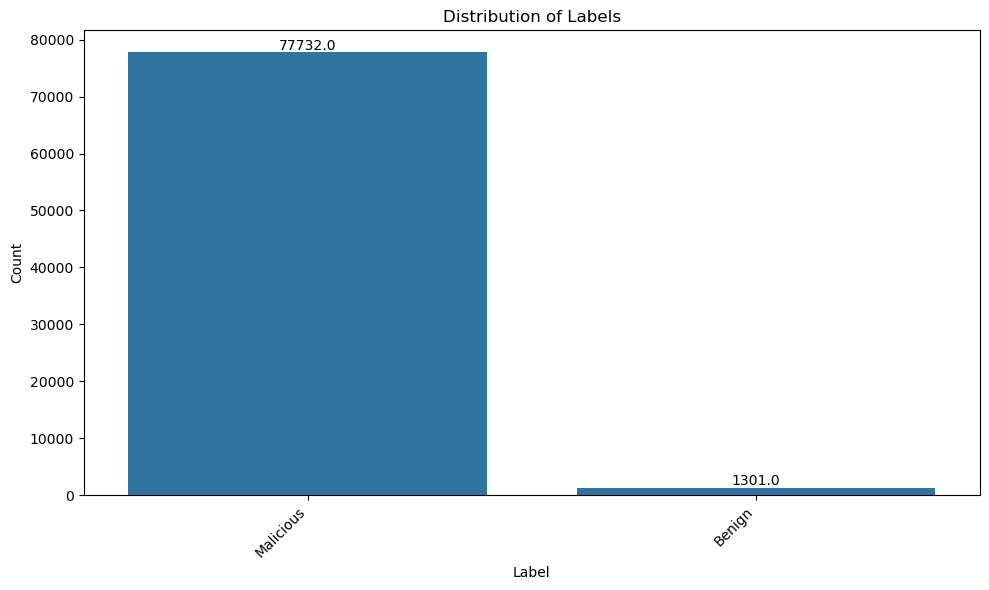

In [5]:
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Label', data=df)
plt.title('Distribution of Labels')
plt.xlabel('Label')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')

# Add count numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

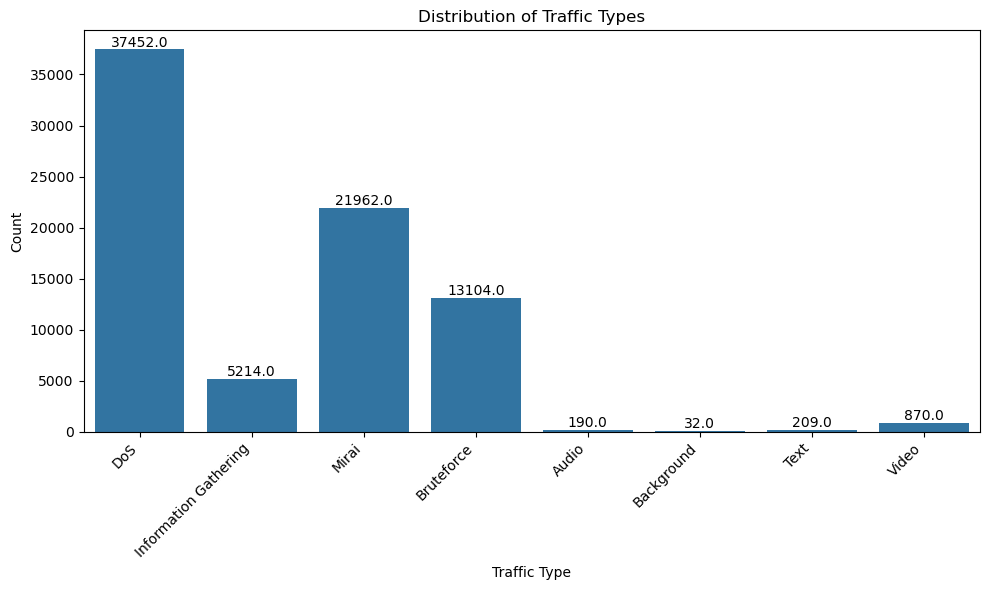

In [6]:
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Traffic Type', data=df)
plt.title('Distribution of Traffic Types')
plt.xlabel('Traffic Type')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')

# Add count numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

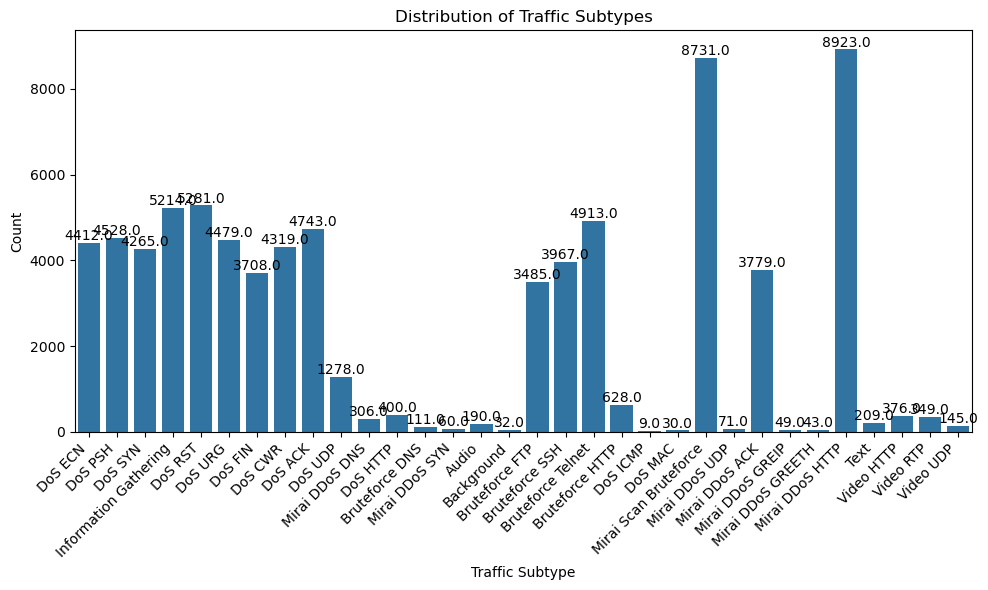

In [7]:
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Traffic Subtype', data=df)
plt.title('Distribution of Traffic Subtypes')
plt.xlabel('Traffic Subtype')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')

# Add count numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

In [8]:
# Initial data overview
counts = df.groupby(['Label', 'Traffic Type', 'Traffic Subtype']).size().reset_index(name='Counts')
print(counts)

        Label           Traffic Type        Traffic Subtype  Counts
0      Benign                  Audio                  Audio     190
1      Benign             Background             Background      32
2      Benign                   Text                   Text     209
3      Benign                  Video             Video HTTP     376
4      Benign                  Video              Video RTP     349
5      Benign                  Video              Video UDP     145
6   Malicious             Bruteforce         Bruteforce DNS     111
7   Malicious             Bruteforce         Bruteforce FTP    3485
8   Malicious             Bruteforce        Bruteforce HTTP     628
9   Malicious             Bruteforce         Bruteforce SSH    3967
10  Malicious             Bruteforce      Bruteforce Telnet    4913
11  Malicious                    DoS                DoS ACK    4743
12  Malicious                    DoS                DoS CWR    4319
13  Malicious                    DoS            

Correlation matrix

    0.9 to 1 or -0.9 to -1 --> Perfect Correlation
    0.5 to 0.9 or -0.5 to -0.9 --> Strong
    0.1 to 0.5 or -0.1 to -0.5 --> Weak
    0.0 to 0.1 or 0.0 to -0.1 --> Uncorrelated



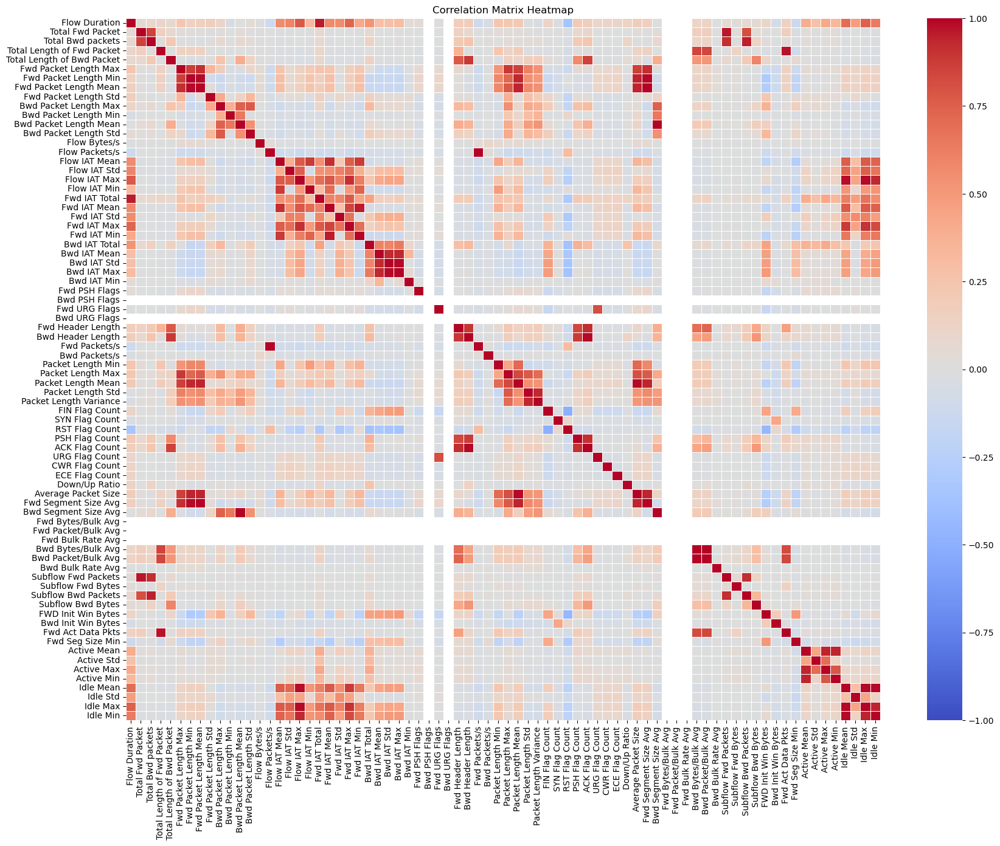

In [9]:
# Drop the unnecessary columns for correlation analysis
corr_df= df.drop(columns=['Flow ID', 'Src IP', 'Dst IP', 'Src Port', 'Dst Port', 'Protocol', 'Timestamp', 'Label', 'Traffic Type', 'Traffic Subtype'])

# Calculate the correlation matrix
corr_df = corr_df.corr()

# Assuming `corr_df` is your correlation matrix
plt.figure(figsize=(20, 15))
sns.heatmap(corr_df, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

### Benign

1e8 ***

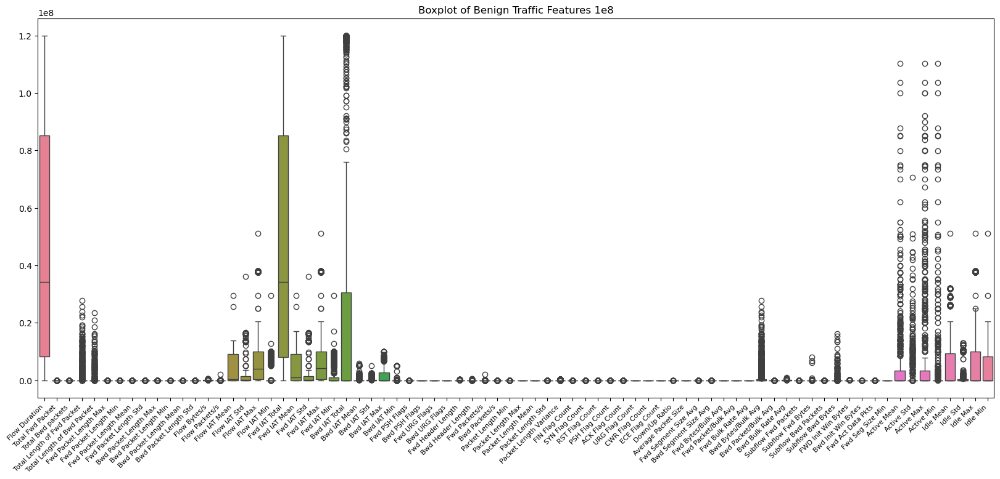

In [10]:
df_benign = df[df['Label'] == 'Benign']
# Drop the unnecessary columns 
df_benign = df_benign.drop(columns=['Flow ID', 'Src IP', 'Dst IP', 'Src Port', 'Dst Port', 'Protocol', 'Timestamp', 'Label', 'Traffic Type', 'Traffic Subtype'])

# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_benign)
plt.xticks(rotation=45, ha='right', fontsize=8)  
plt.title('Boxplot of Benign Traffic Features 1e8')
plt.show()

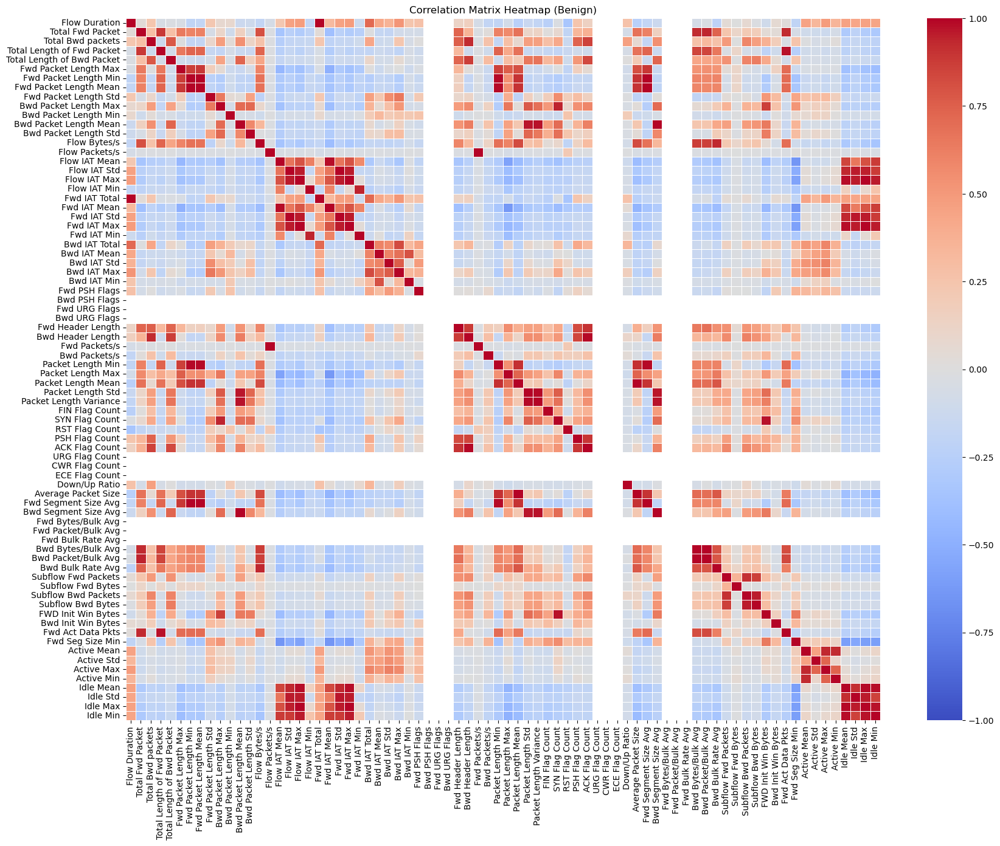

In [11]:
# Calculate the correlation matrix
corr_df_benign = df_benign.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_df_benign, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix Heatmap (Benign)')
plt.show()

### DoS

1e8 ***

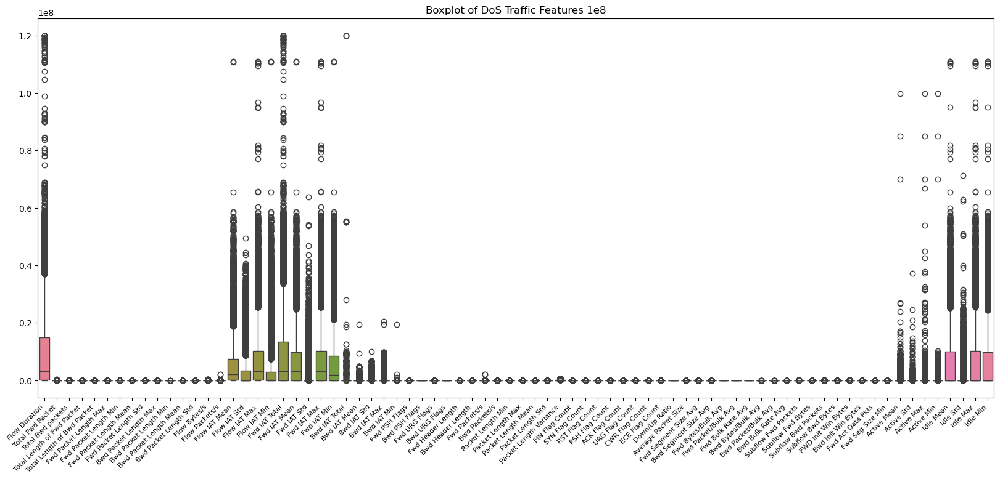

In [12]:
df_dos = df[df['Traffic Type'] == 'DoS']
# Drop the unnecessary columns
df_dos = df_dos.drop(columns=['Flow ID', 'Src IP', 'Dst IP', 'Src Port', 'Dst Port', 'Protocol', 'Timestamp', 'Label', 'Traffic Type', 'Traffic Subtype'])

# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_dos)
plt.xticks(rotation=45, ha='right', fontsize=8)  
plt.title('Boxplot of DoS Traffic Features 1e8')
plt.show()

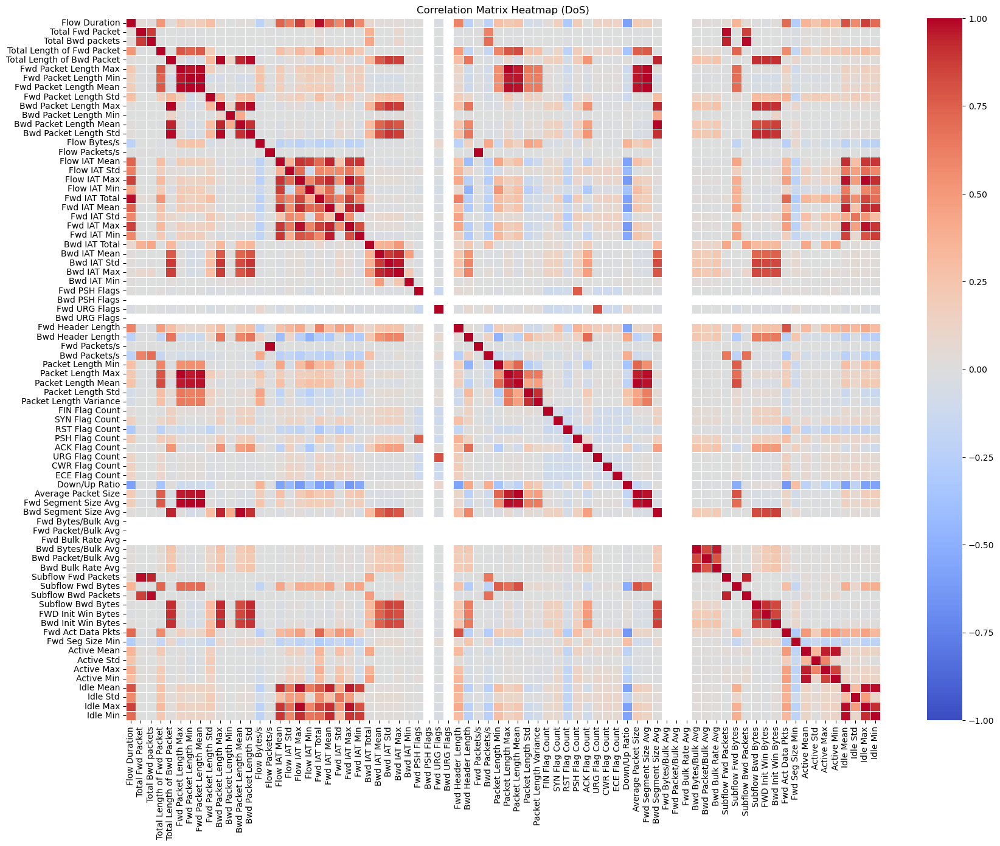

In [13]:
# Calculate the correlation matrix
corr_df_dos = df_dos.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_df_dos, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix Heatmap (DoS)')
plt.show()

### Bruteforce

1e8 ***

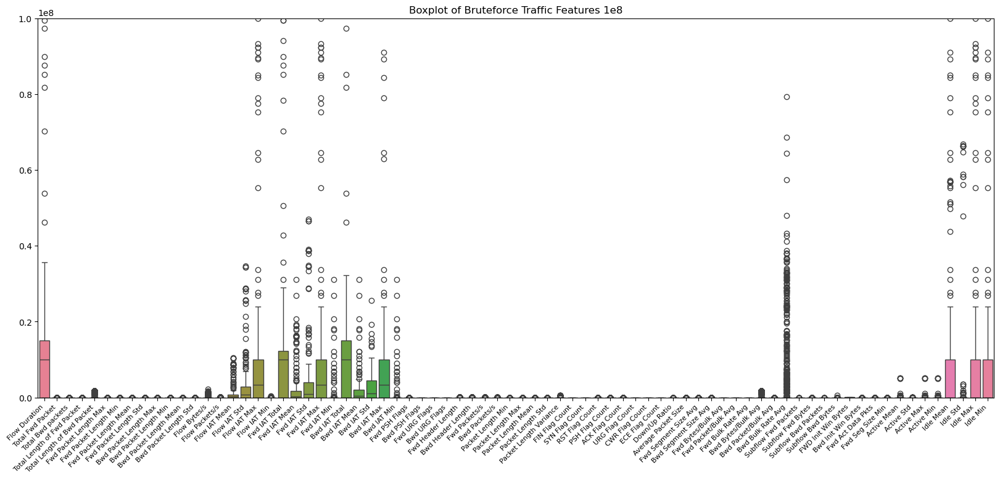

In [14]:
df_bruteforce = df[df['Traffic Type'] == 'Bruteforce']
# Drop the unnecessary columns 
df_bruteforce = df_bruteforce.drop(columns=['Flow ID', 'Src IP', 'Dst IP', 'Src Port', 'Dst Port', 'Protocol', 'Timestamp', 'Label', 'Traffic Type', 'Traffic Subtype'])

# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_bruteforce)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.ylim(0, 1e8)
plt.title('Boxplot of Bruteforce Traffic Features 1e8')
plt.show()

1e9

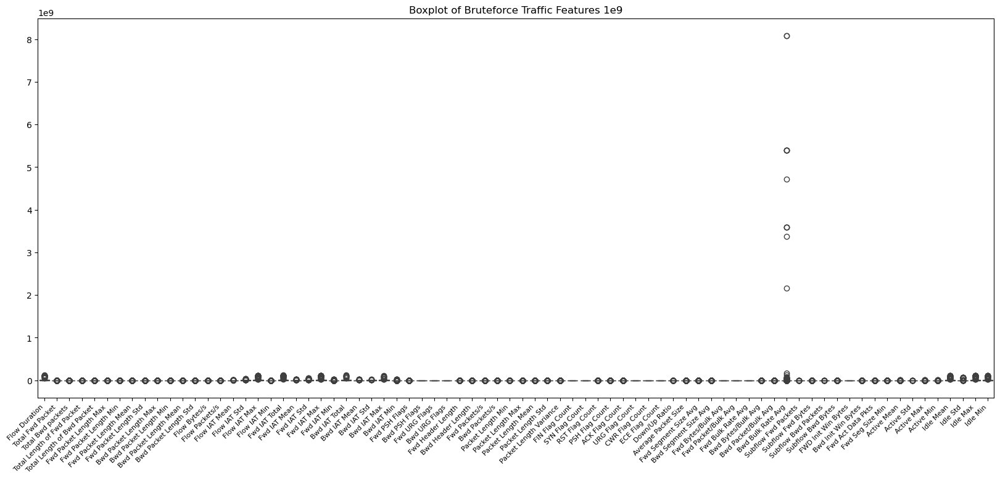

In [15]:
# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_bruteforce)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Boxplot of Bruteforce Traffic Features 1e9')
plt.show()

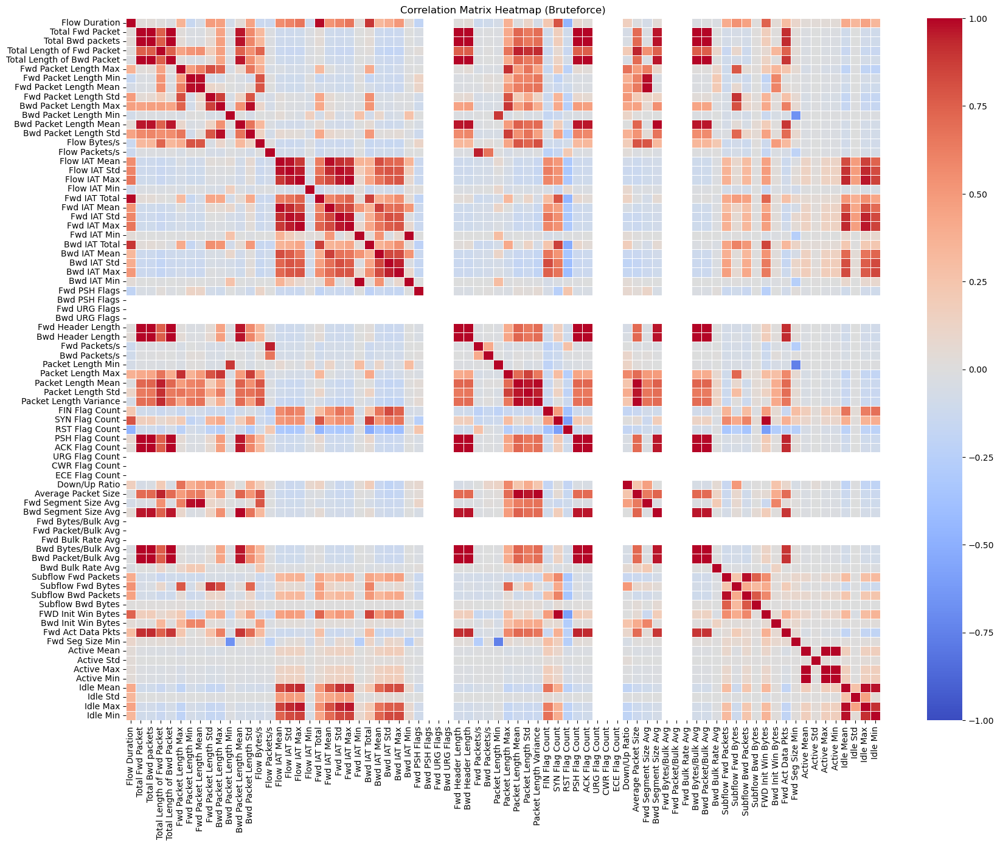

In [16]:

# Calculate the correlation matrix
corr_df_bruteforce = df_bruteforce.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_df_bruteforce, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix Heatmap (Bruteforce)')
plt.show()

### Infomation Gathering

1e7 ***

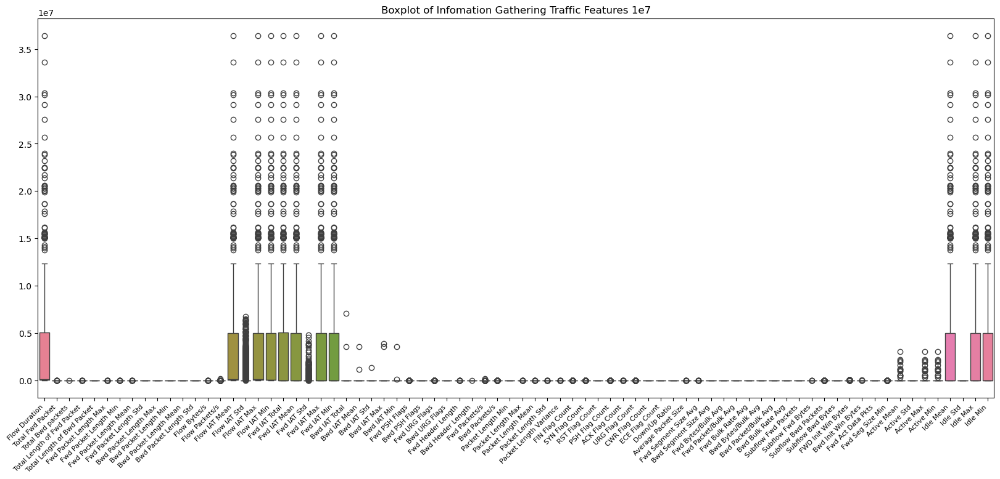

In [17]:
df_infogat = df[df['Traffic Type'] == 'Information Gathering']
# Drop the unnecessary columns
df_infogat = df_infogat.drop(columns=['Flow ID', 'Src IP', 'Dst IP', 'Src Port', 'Dst Port', 'Protocol', 'Timestamp', 'Label', 'Traffic Type', 'Traffic Subtype'])

# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_infogat)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Boxplot of Infomation Gathering Traffic Features 1e7')
plt.show()

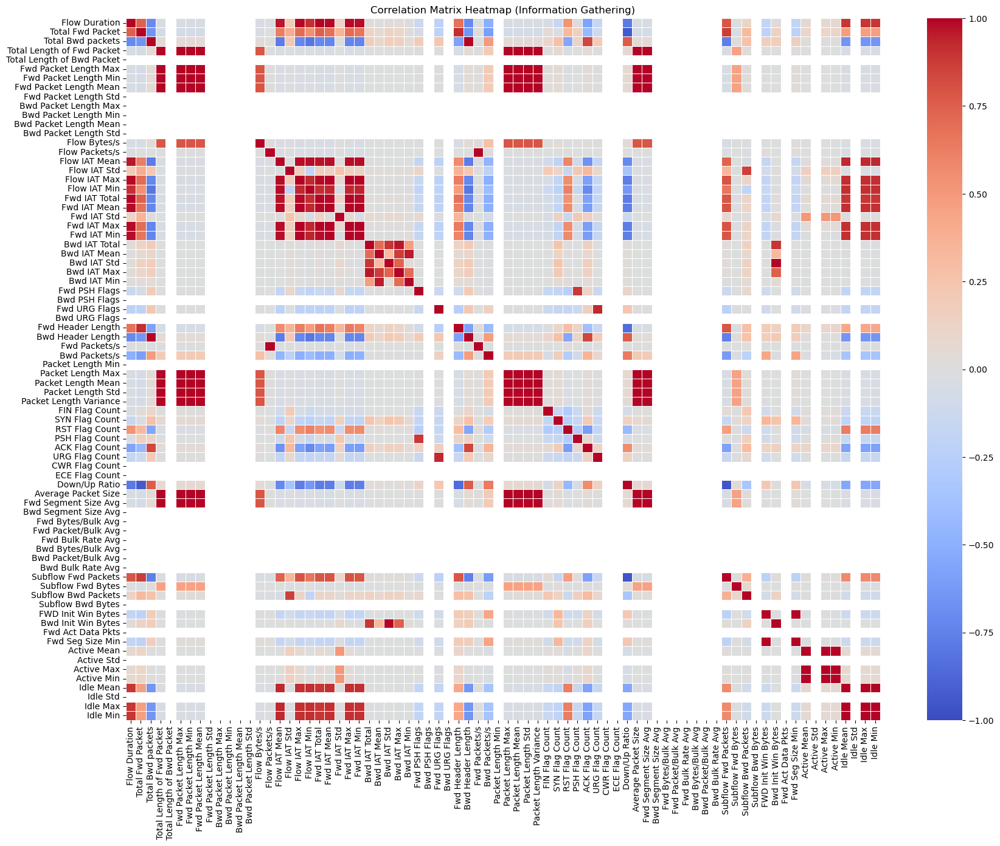

In [18]:
# Calculate the correlation matrix
corr_df_infogat = df_infogat.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_df_infogat, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix Heatmap (Information Gathering)')
plt.show()

### Mirai

1e7

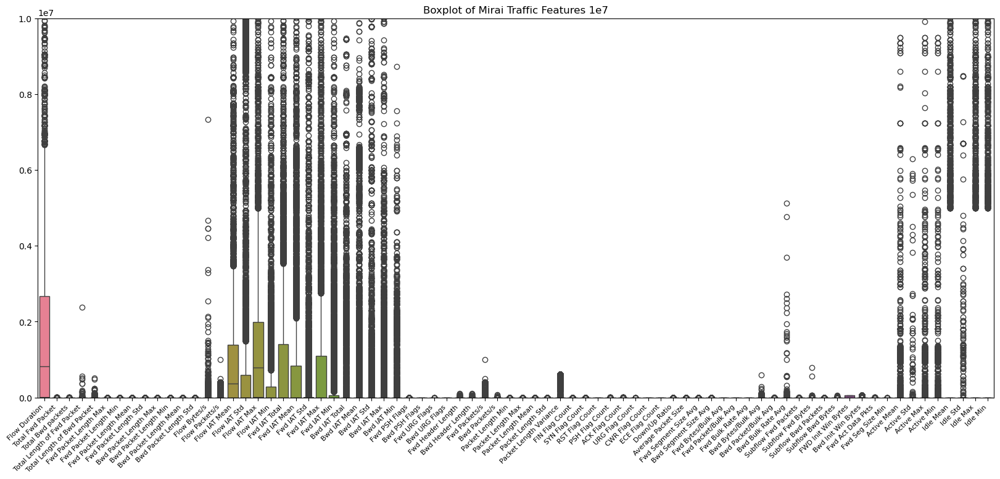

In [19]:
df_mirai = df[df['Traffic Type'] == 'Mirai']
# Drop the unnecessary columns
df_mirai = df_mirai.drop(columns=['Flow ID', 'Src IP', 'Dst IP', 'Src Port', 'Dst Port', 'Protocol', 'Timestamp', 'Label', 'Traffic Type', 'Traffic Subtype'])

# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_mirai)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.ylim(0, 1e7)
plt.title('Boxplot of Mirai Traffic Features 1e7')
plt.show()

1e8 ***

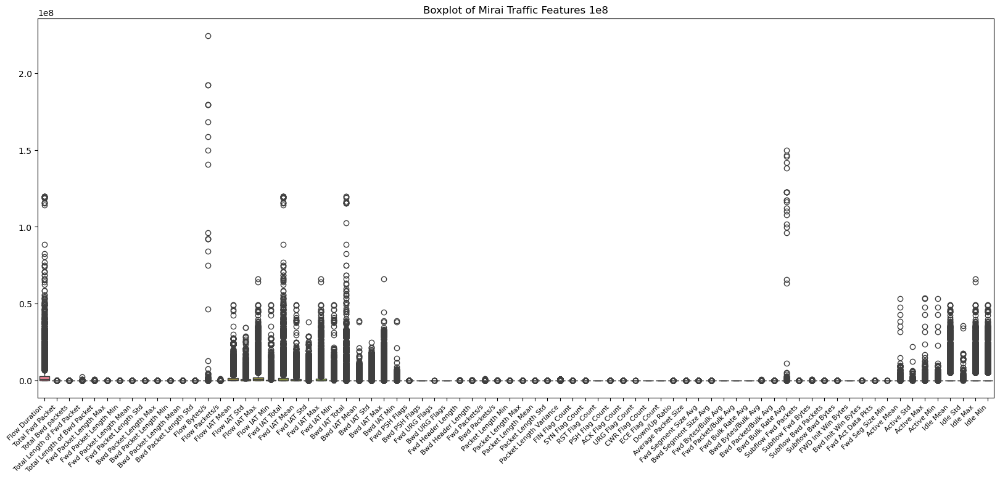

In [20]:
# Create a boxplot for all the remaining columns
plt.figure(figsize=(20, 8))
sns.boxplot(data=df_mirai)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.title('Boxplot of Mirai Traffic Features 1e8')
plt.show()

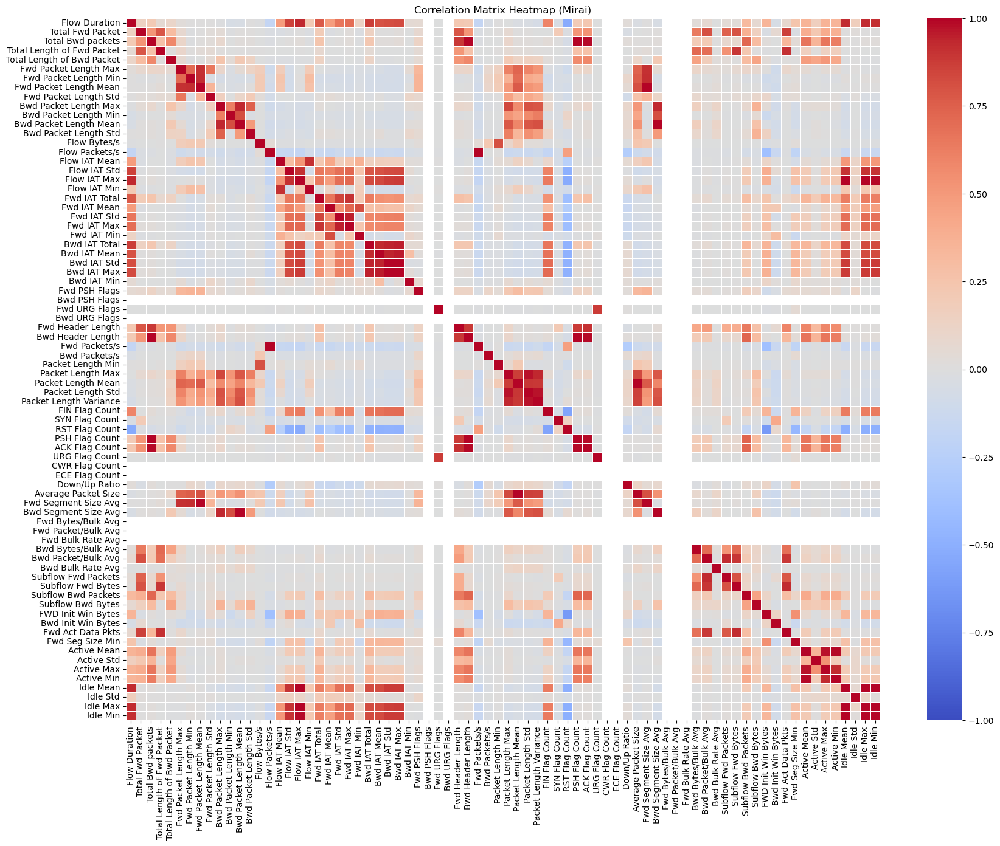

In [21]:
# Calculate the correlation matrix
corr_df_mirai = df_mirai.corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr_df_mirai, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation Matrix Heatmap (Mirai)')
plt.show()

# **Data Preparing**

- Drop unused columns  
- Drop duplicate rows  
- Set decimal round to 3  

In [22]:
TARGET_VARIABLE = 'Traffic Subtype'
DROP_COLUMNS = ['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Timestamp']
TARGET_TO_DROP = {'Label': ['Traffic Type', 'Traffic Subtype'],
                  'Traffic Type': ['Label', 'Traffic Subtype'],
                  'Traffic Subtype': ['Label', 'Traffic Type']}

# Drop 5-tuple collumns and timestamp
df = df.drop(columns=DROP_COLUMNS)

# Filter out duplicates within the same target
df = df.round(3)
df = df.drop_duplicates()
df = df.drop(columns=TARGET_TO_DROP[TARGET_VARIABLE])

# **Machine Learning Process**

**Traffic Subtype** as a main label for classifier  

**Supervised model** as a baseline which are including  

**Tree-Based Models (Ensemble & Non-Ensemble)**  

Decision Tree ✅ (Already implemented)  
Random Forest ✅ (Already implemented)  
XGBoost (Extreme Gradient Boosting) ✅ (Already implemented)  
LightGBM (Light Gradient Boosting Machine) ✅ (Already implemented)    
AdaBoost ✅ (Already implemented)    
CatBoost ✅ (Already implemented)    

**Linear Models**  

Logistic Regression ✅ (Already implemented)  
Support Vector Machine (SVM) (Linear & Kernel-based RBF, Poly, etc.) ❌ (Canceled) (Take too much time to train compare to the others. This is the longest time consume.)  

**Probabilistic Models**  

Naïve Bayes (Gaussian, Multinomial, Bernoulli, etc.) ✅ (Already implemented)  

**Instance-Based Models**  

K-Nearest Neighbors (KNN) ✅ (Already implemented)  

**Each model will do 3 times with different parameters (settings) for getting a various result**  
**Model that have result followed by parameter number 1 is a default one that the system recommend**  
**Other two will be set prior on training performance for maximize the result but also consider overfitting accident**  
**Time of training process will also be considered**  
**All of model will get similar value of param for making them scope in the same environment**  

## **ML Data Preparing**

In [23]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import AdaBoostClassifier
from catboost import CatBoostClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.inspection import permutation_importance

In [24]:
# Separate features and target
X = df.drop(TARGET_VARIABLE, axis=1)
y = df[TARGET_VARIABLE]

# Encode target
le = LabelEncoder()
y = le.fit_transform(y)

# Compute train and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Identifying Numerical and Categorical columns
numerical_cols = X_train.select_dtypes(include=[np.number]).columns.to_list()
categorical_cols = X_train.select_dtypes(include=[object]).columns.to_list()

# Pipelines for Numerical and Categorical Data Transformations
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values with mean
    ('scaler', StandardScaler())  # Scale numerical features
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Impute missing values with mode
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encode categorical features
])

# Column Transformer combining both pipelines
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Apply preprocessor to train and test data
preprocessor.fit(X_train)
X_train = preprocessor.transform(X_train)
X_test = preprocessor.transform(X_test) 

**Apply SMOTE**  
  
**SMOTE (Synthetic Minority Over-sampling Technique)** is applied to datasets to address **class imbalance problems**.  This occurs when one class has significantly fewer instances than another.  SMOTE **creates synthetic samples** of the minority class by interpolating between existing minority class data points, **making the dataset more balanced**. This helps **improve the performance of machine learning models**.

In [25]:
# Apply SMOTE to the training data to balance the classes
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

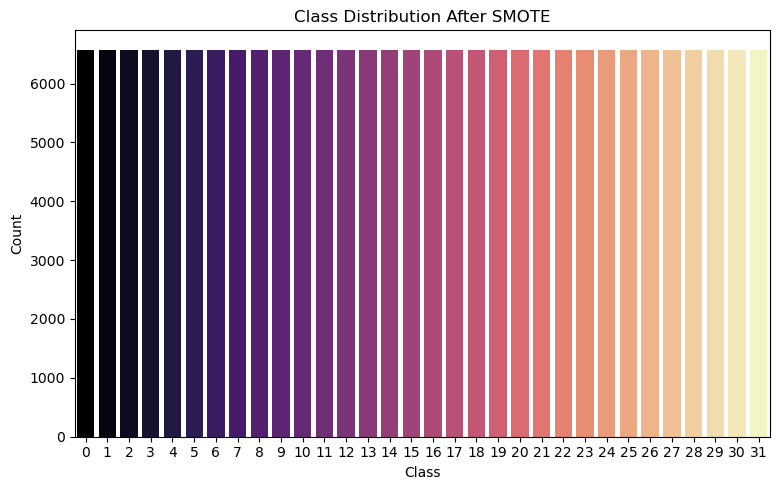

In [26]:
# Class distribution after SMOTE
unique_classes, counts_after = np.unique(y_train, return_counts=True)

# Plotting
plt.figure(figsize=(15, 5))

# After SMOTE
plt.subplot(1, 2, 1)
sns.barplot(x=unique_classes, y=counts_after, hue=unique_classes, palette="magma", legend=False)
plt.title('Class Distribution After SMOTE')
plt.xlabel('Class')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

## **Random Forest Classifier**

In [27]:
# Dictionary to store the models
models = {}
hyperparameters = [
    {'n_estimators': 100, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 1},  # Baseline model with moderate complexity.
    {'n_estimators': 200, 'max_depth': 20, 'min_samples_split': 10, 'min_samples_leaf': 4},  # High-complexity model
    {'n_estimators': 200, 'max_depth': 30, 'min_samples_split': 2, 'min_samples_leaf': 1,}  # Allows full depth, minimal constraints.
]

# Loop to create and train 3 models
for i in range(3):
    # Create and train the model
    model = RandomForestClassifier(random_state=42, verbose=0, n_jobs=-1, **hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'rdfor{i+1}'] = model

# Print confirmation
print("Models trained and stored in the 'models' dictionary.")

Models trained and stored in the 'models' dictionary.


In [28]:
# Initialize dictionaries to store the results
accuracy_ = {}
f1_ = {}
precision_ = {}
recall_ = {}
roc_auc_ = {}
confusion_matrix_ = {}
classification_reports_ = {}

# Loop through the models rdfor1, rdfor2, rdfor3
for i in range(1, 4):
    model_name = f'rdfor{i}'
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro')
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, y_pred) 
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

## **Result of random forest classifier**

### rdfor1

In [29]:
# Evaluate rdfor1
model_name = 'rdfor1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: rdfor1
Accuracy: 0.9597235145553635
F1 Score: 0.8711708161233462
Precision: 0.8573022079694103
Recall: 0.909309257313337
ROC AUC: 0.9987201481693585
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 61  0  0]
 [ 0  1  0 ...  0 68  1]
 [ 0  0  0 ...  0  1 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93        38
           1       0.75      1.00      0.86         6
           2       1.00      1.00      1.00        22
           3       1.00      0.99      1.00       697
           4       0.99      0.99      0.99       126
           5       0.93      0.98      0.95       785
           6       1.00      0.94      0.97       974
           7       0.97      0.95      0.96       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.96      1.00      0.98       

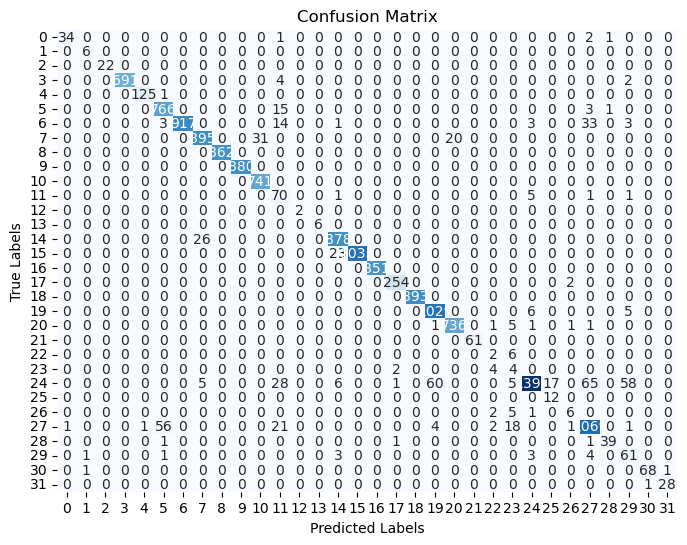

In [30]:
# Compute the confusion matrix
model_name = 'rdfor1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

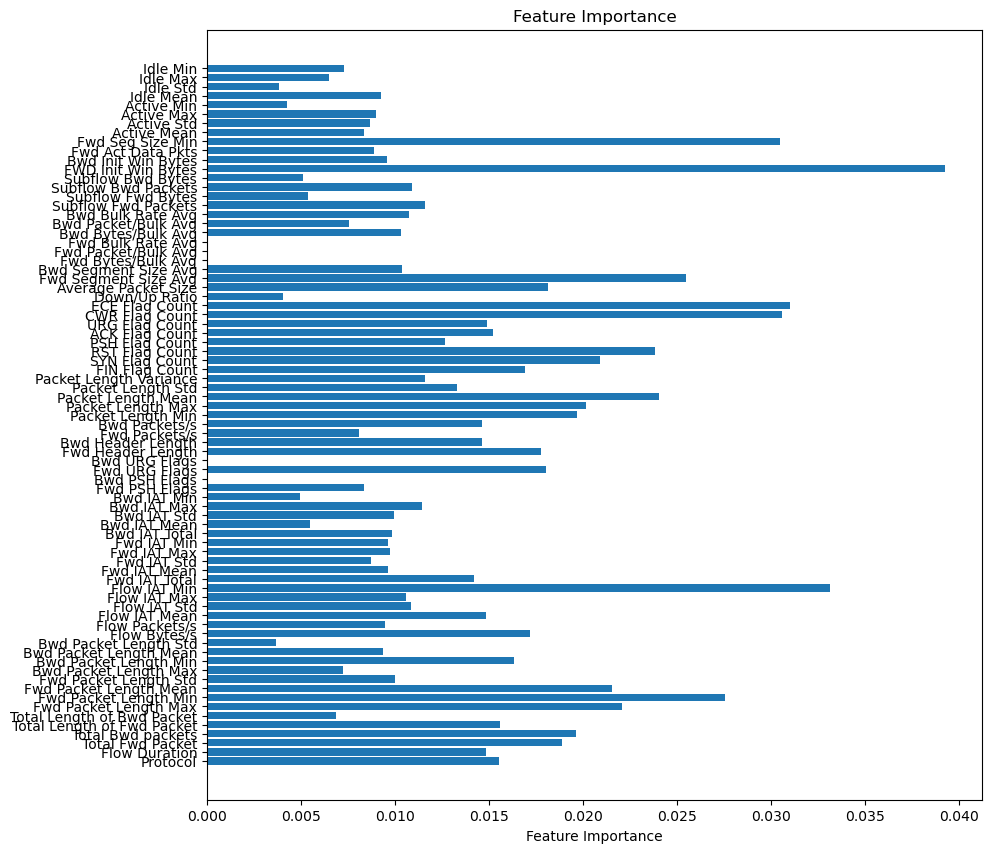

In [31]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'rdfor1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### rdfor2

In [32]:
# Evaluate rdfor2
model_name = 'rdfor2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: rdfor2
Accuracy: 0.9841153795028579
F1 Score: 0.8973571221908565
Precision: 0.8850516345645723
Recall: 0.9188445279201373
ROC AUC: 0.9995395339463574
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 1  5  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 65  0  0]
 [ 0  0  0 ...  0 70  0]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.89      0.83        38
           1       0.83      0.83      0.83         6
           2       0.92      1.00      0.96        22
           3       1.00      0.99      1.00       697
           4       1.00      1.00      1.00       126
           5       0.99      0.99      0.99       785
           6       0.99      0.97      0.98       974
           7       0.99      0.99      0.99       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       1.00      1.00      1.00      

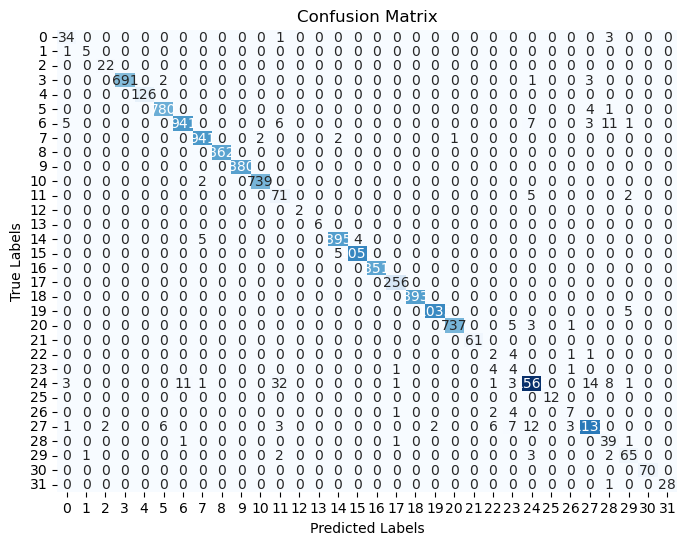

In [33]:
# Compute the confusion matrix
model_name = 'rdfor2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

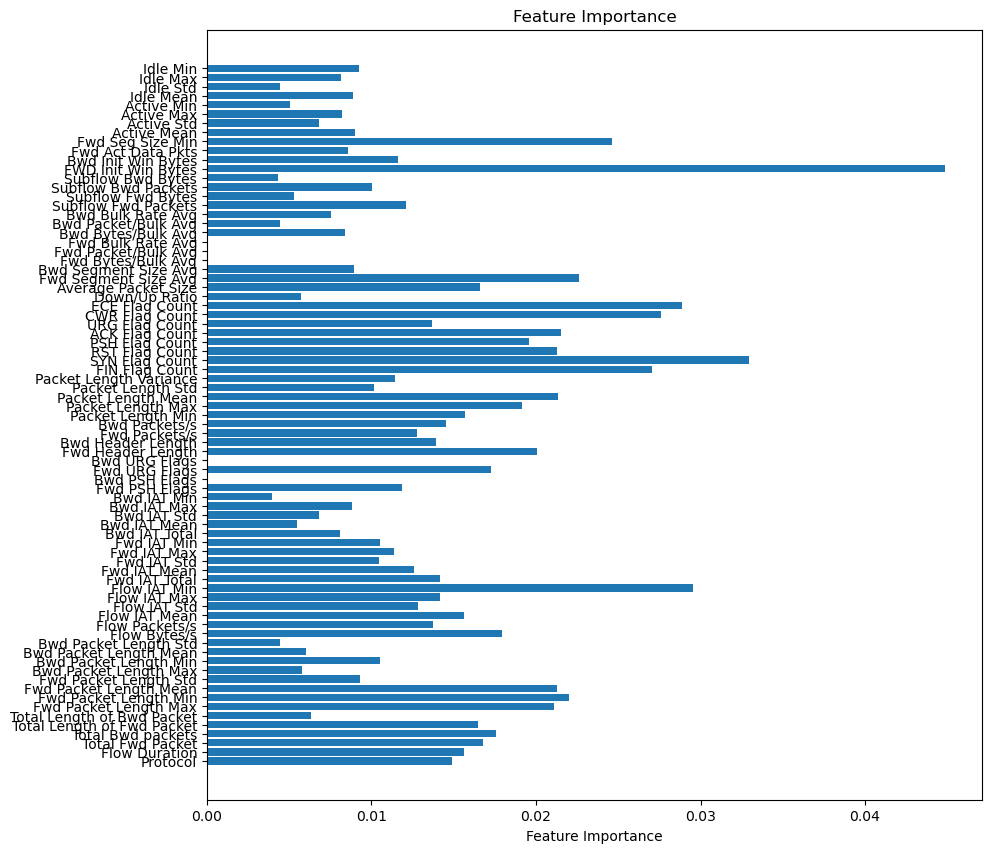

In [34]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'rdfor2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### rdfor3

In [35]:
# Evaluate rdfor3
model_name = 'rdfor3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: rdfor3
Accuracy: 0.9861757277681776
F1 Score: 0.899485963975804
Precision: 0.8977231233740639
Recall: 0.9074515744353248
ROC AUC: 0.9953281189464904
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 2  4  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 65  0  0]
 [ 0  0  0 ...  0 70  0]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.89      0.85        38
           1       0.80      0.67      0.73         6
           2       1.00      1.00      1.00        22
           3       1.00      0.99      1.00       697
           4       1.00      1.00      1.00       126
           5       1.00      0.99      0.99       785
           6       0.98      0.97      0.98       974
           7       0.99      1.00      1.00       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       1.00      1.00      1.00       

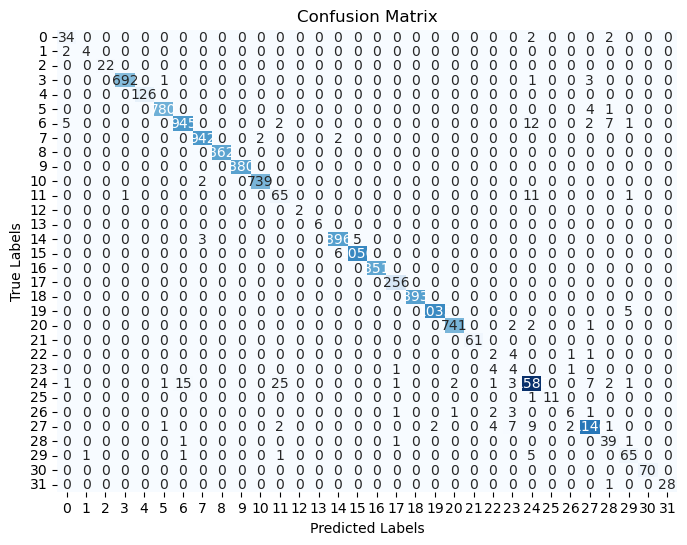

In [36]:
# Compute the confusion matrix
model_name = 'rdfor3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

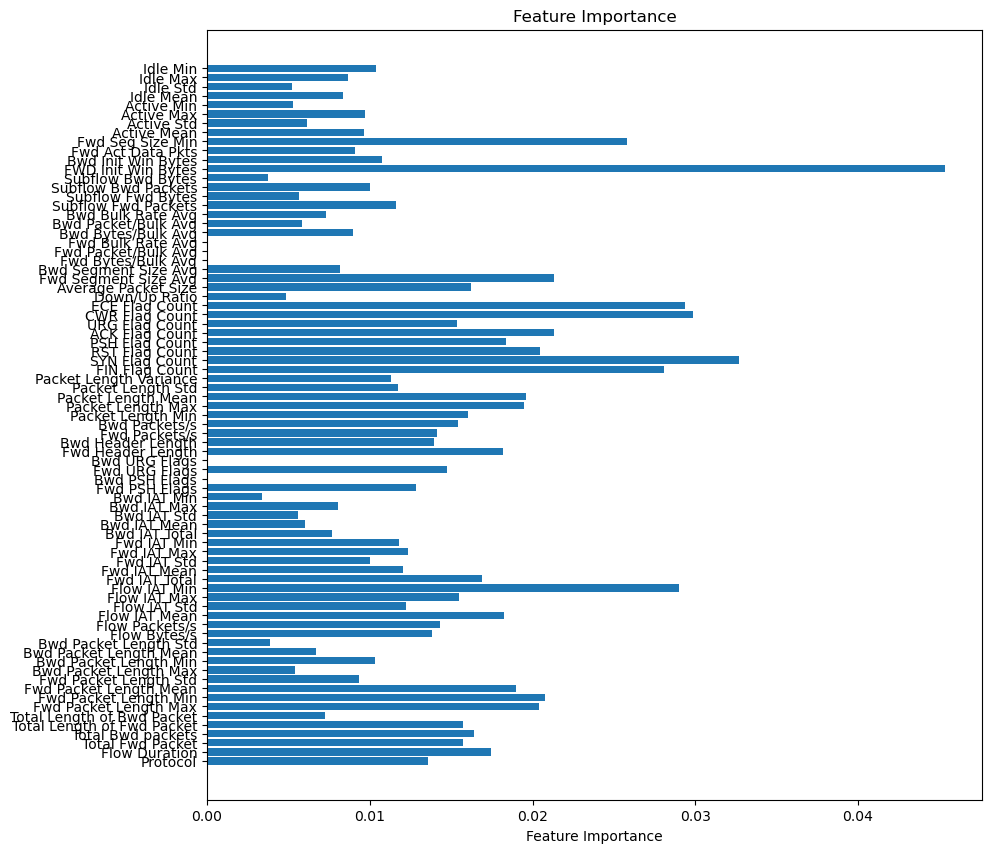

In [37]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'rdfor3'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

## **Decision Tree Classifier**

In [38]:
# Dictionary to store the models
hyperparameters = [
    {'max_depth': 15, 'min_samples_split': 5, 'min_samples_leaf': 2}, # Balanced model with moderate depth, prevents overfitting.
    {'max_depth': 20, 'min_samples_split': 10, 'min_samples_leaf': 4}, # Deeper tree with stricter splits for better generalization.
    {'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1} # No depth limit, allowing full tree growth, risks overfitting.
]

# Loop to create and train 3 models
for i in range(3):
    # Create and train the model (Decision Tree)
    model = DecisionTreeClassifier(random_state=42, **hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'dtree{i+1}'] = model

# Print confirmation
print("Models trained and stored in the 'models' dictionary.")

Models trained and stored in the 'models' dictionary.


In [39]:
# Loop through the models dtree1, dtree2, dtree3 (Decision Tree models)
for i in range(1, 4):
    model_name = f'dtree{i}'
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro')
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, y_pred) 
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

## **Result of decision tree classifier**

### dtree1

In [40]:
# Evaluate dtree1
model_name = 'dtree1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: dtree1
Accuracy: 0.9506845673268642
F1 Score: 0.852548267577268
Precision: 0.8490412771801175
Recall: 0.8827247564389116
ROC AUC: 0.9787128823759612
Confusion Matrix:
 [[29  0  0 ...  2  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 68  0  0]
 [ 0  0  0 ...  2 68  0]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.76      0.78        38
           1       0.86      1.00      0.92         6
           2       0.92      1.00      0.96        22
           3       0.99      0.99      0.99       697
           4       0.99      0.93      0.96       126
           5       0.88      0.98      0.93       785
           6       0.99      0.90      0.95       974
           7       0.99      0.99      0.99       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       1.00      0.99      0.99       

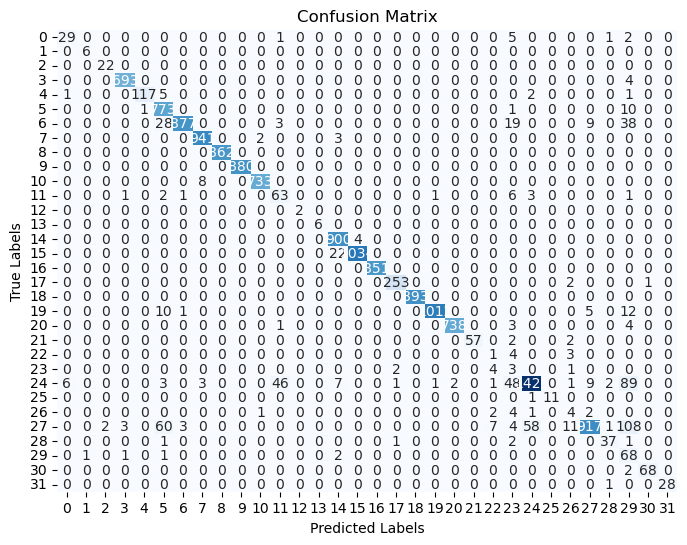

In [41]:
# Compute the confusion matrix
model_name = 'dtree1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

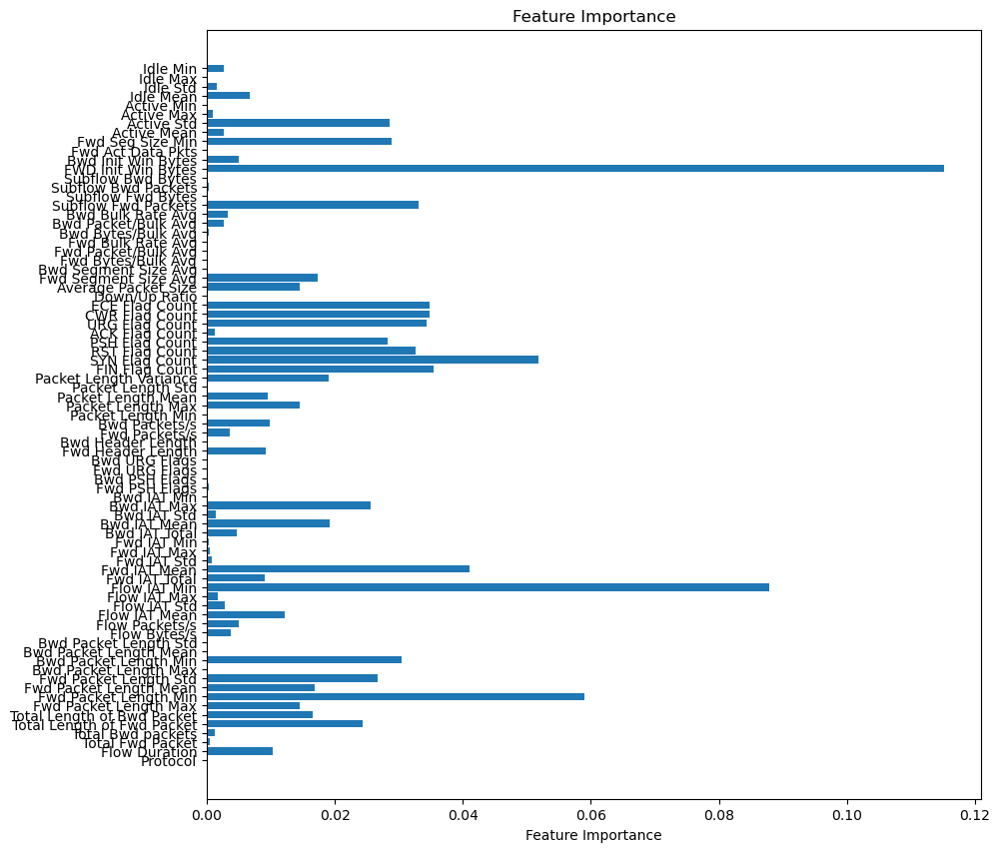

In [42]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'dtree1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### dtree2

In [43]:
# Evaluate dtree2
model_name = 'dtree2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: dtree2
Accuracy: 0.9789977402631929
F1 Score: 0.8642779823417154
Precision: 0.8548014985237697
Recall: 0.8909455802250561
ROC AUC: 0.9630259923629618
Confusion Matrix:
 [[32  0  0 ...  0  0  0]
 [ 2  4  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 68  0  0]
 [ 0  0  0 ...  0 70  0]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.84      0.89        38
           1       0.67      0.67      0.67         6
           2       0.92      1.00      0.96        22
           3       0.99      1.00      0.99       697
           4       0.96      0.98      0.97       126
           5       0.99      0.99      0.99       785
           6       0.99      0.96      0.98       974
           7       0.99      1.00      1.00       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       1.00      0.99      1.00      

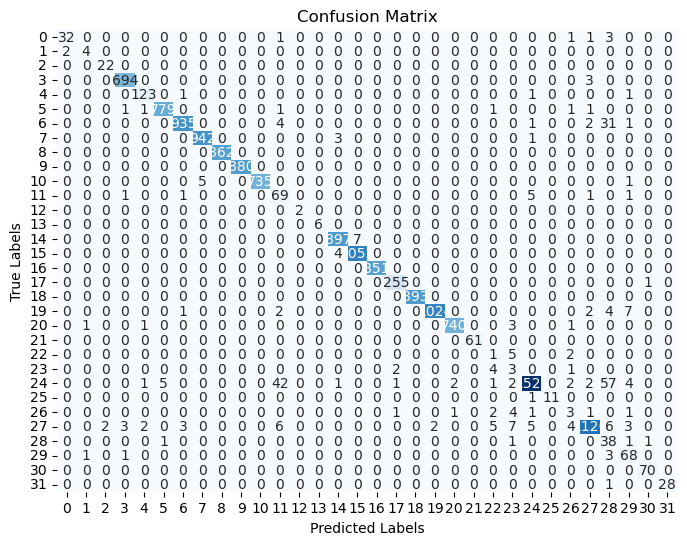

In [44]:
# Compute the confusion matrix
model_name = 'dtree2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

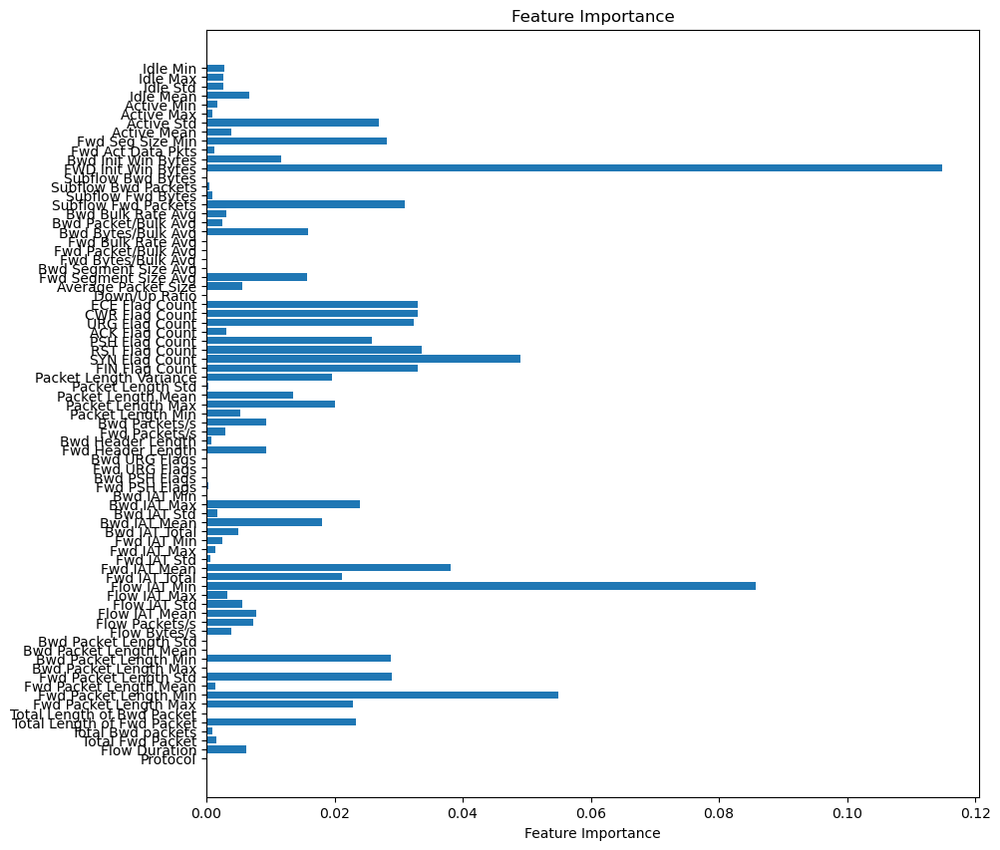

In [45]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'dtree2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### dtree3

In [46]:
# Evaluate dtree3
model_name = 'dtree3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: dtree3
Accuracy: 0.9865745048517879
F1 Score: 0.8935418260891763
Precision: 0.8914939923055731
Recall: 0.9007898500205775
ROC AUC: 0.9501782535329042
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 1  4  0 ...  0  0  1]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 67  0  0]
 [ 0  0  0 ...  1 69  0]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.89      0.86        38
           1       0.80      0.67      0.73         6
           2       1.00      1.00      1.00        22
           3       1.00      1.00      1.00       697
           4       1.00      0.98      0.99       126
           5       1.00      1.00      1.00       785
           6       0.98      0.97      0.97       974
           7       0.99      0.99      0.99       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       1.00      0.99      1.00      

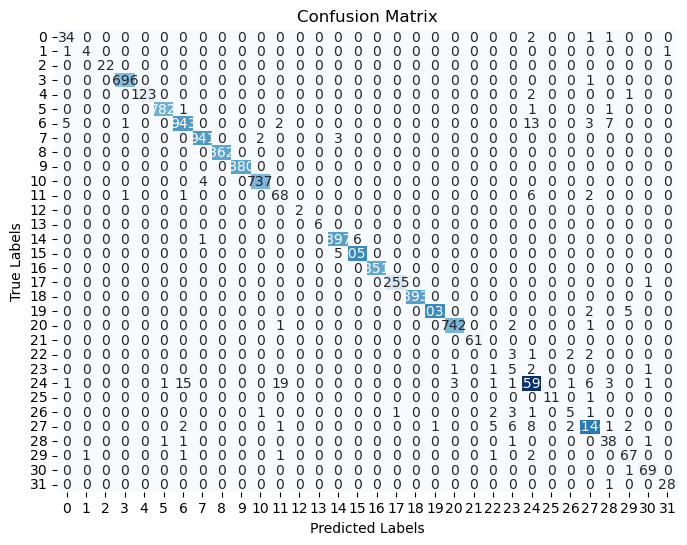

In [47]:
# Compute the confusion matrix
model_name = 'dtree3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

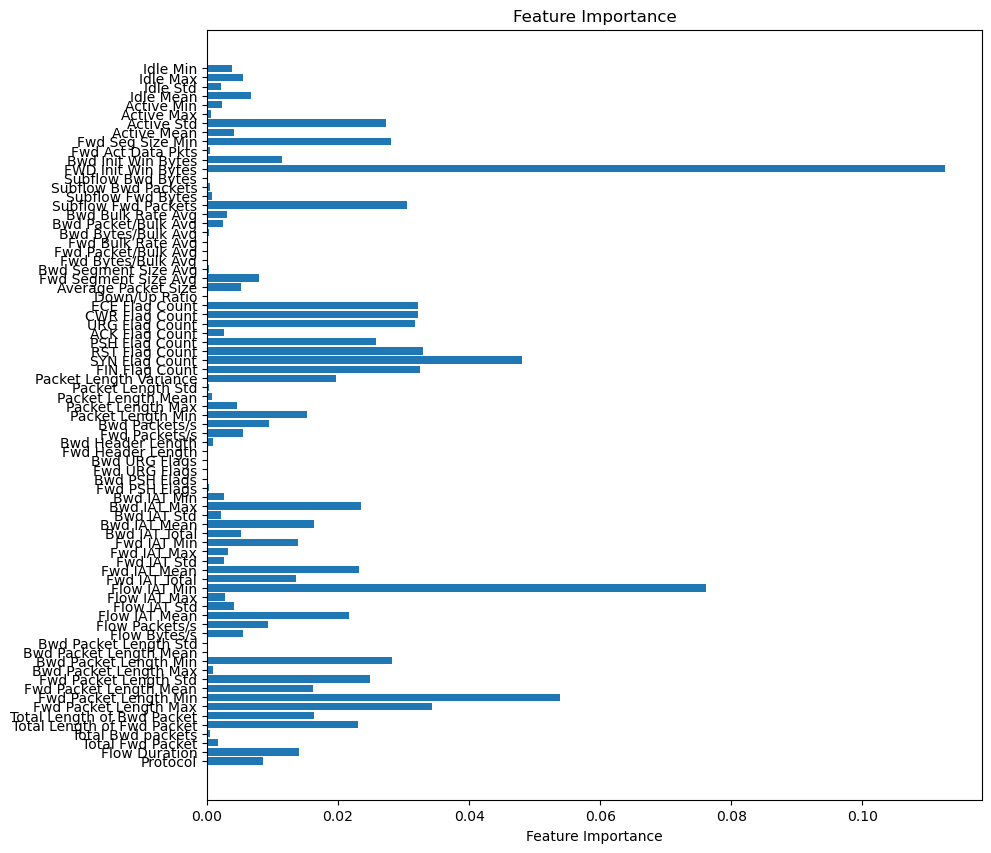

In [48]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'dtree3'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

## **Logistic Regression**

The worst way to do classifier  
1. take too much time compare to another method and get less score (depend on max_iter param. if its more than 100. its will take the time longer. even longer than rdfor and dtree method) (better solver param make the train process longer)

In [49]:
# Streamlined hyperparameters for Logistic Regression
hyperparameters = [
    {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 10, 'class_weight': None}, # Low iterations for quick testing
    {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 100, 'class_weight': None}, # Default configuration
    {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs', 'max_iter': 500, 'class_weight': None}, # High iterations for better convergence
]

# Loop to create and train models
for i in range (3):
    # Create and train the model (Logistic Regression)
    model = LogisticRegression(random_state=42, **hyperparameters[i])
    model.fit(X_train, y_train)
    
    # Store the model in the dictionary with a unique name
    models[f'logreg{i+1}'] = model

# Print confirmation
print("Models trained and stored in the 'models' dictionary.")

d:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
d:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_resu

Models trained and stored in the 'models' dictionary.


d:\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [50]:
# Loop through the models logreg1, logreg2, logreg3, etc. (Logistic Regression models)
for i in range(1, 4):
    model_name = f'logreg{i}'
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

## **Result of Logistic Regression**

### logreg1

In [51]:
# Evaluate logreg1
model_name = 'logreg1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: logreg1
Accuracy: 0.6345872657184634
F1 Score: 0.5080309356438777
Precision: 0.5308009324827772
Recall: 0.6167677671100736
ROC AUC: 0.9472276570219945
Confusion Matrix:
 [[24  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 21 ...  0  0  0]
 ...
 [ 0  5  0 ... 12  0  0]
 [ 0  6  0 ...  0 40 17]
 [ 0  6  0 ...  0  4 19]]
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.63      0.69        38
           1       0.19      1.00      0.32         6
           2       0.18      0.95      0.31        22
           3       0.85      0.99      0.91       697
           4       0.39      0.91      0.55       126
           5       0.89      0.48      0.63       785
           6       0.40      0.83      0.54       974
           7       0.51      0.20      0.29       946
           8       1.00      0.94      0.97       862
           9       1.00      0.94      0.97       880
          10       0.88      0.75      0.81     

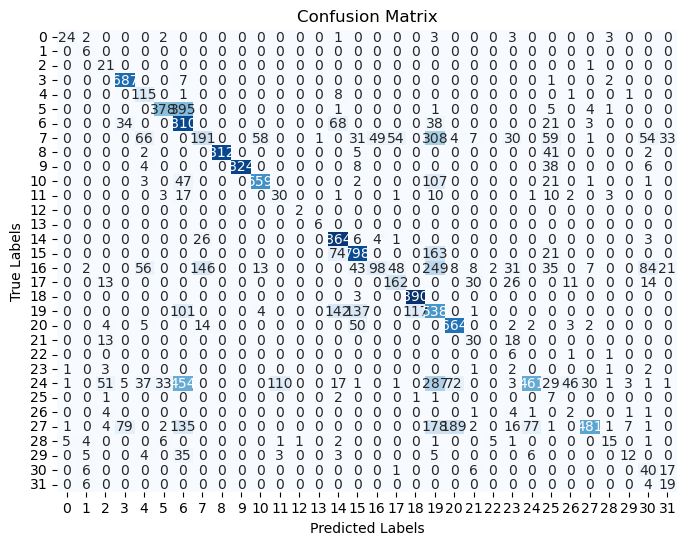

In [52]:
# Compute the confusion matrix
model_name = 'logreg1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

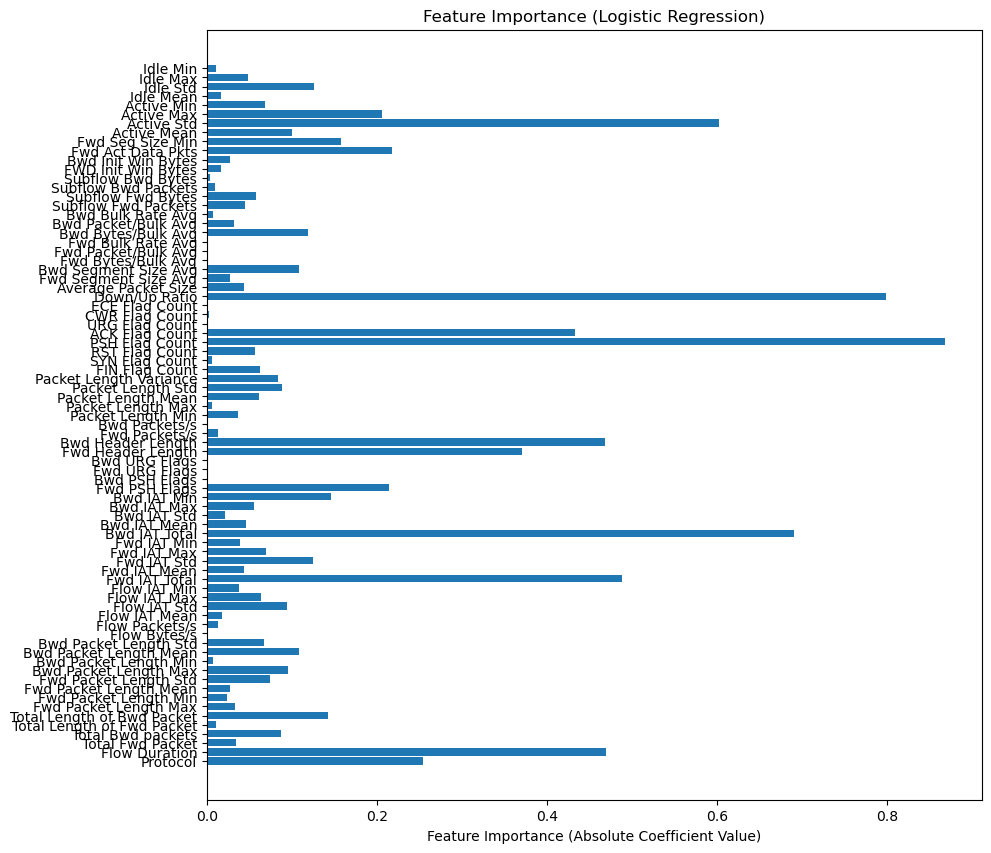

In [53]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'logreg1'  # Specify the model name

plt.figure(figsize=(10, 10))

# Access and process coefficients
importance_logreg = abs(models[model_name].coef_[0])  # Take absolute values
features = df.columns[:-1] # get the feature names.

# Visualization
plt.barh(features, importance_logreg)
plt.xlabel('Feature Importance (Absolute Coefficient Value)')
plt.title('Feature Importance (Logistic Regression)')
plt.show()

### logreg2

In [54]:
# Evaluate logreg2
model_name = 'logreg2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: logreg2
Accuracy: 0.8872790110328327
F1 Score: 0.7425321380618413
Precision: 0.7336473411791623
Recall: 0.8163899990962469
ROC AUC: 0.9874992266175273
Confusion Matrix:
 [[32  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 21 ...  0  0  0]
 ...
 [ 0  5  0 ... 49  0  0]
 [ 0  6  0 ...  0 37 20]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.84      0.88        38
           1       0.20      1.00      0.33         6
           2       0.78      0.95      0.86        22
           3       0.99      0.99      0.99       697
           4       0.91      0.98      0.95       126
           5       0.89      0.96      0.93       785
           6       0.95      0.92      0.93       974
           7       0.91      0.90      0.90       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.89      0.96      0.92     

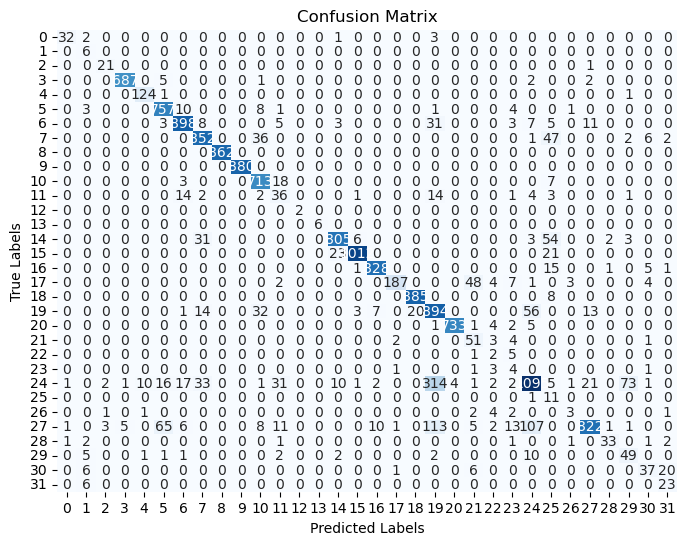

In [55]:
# Compute the confusion matrix
model_name = 'logreg2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

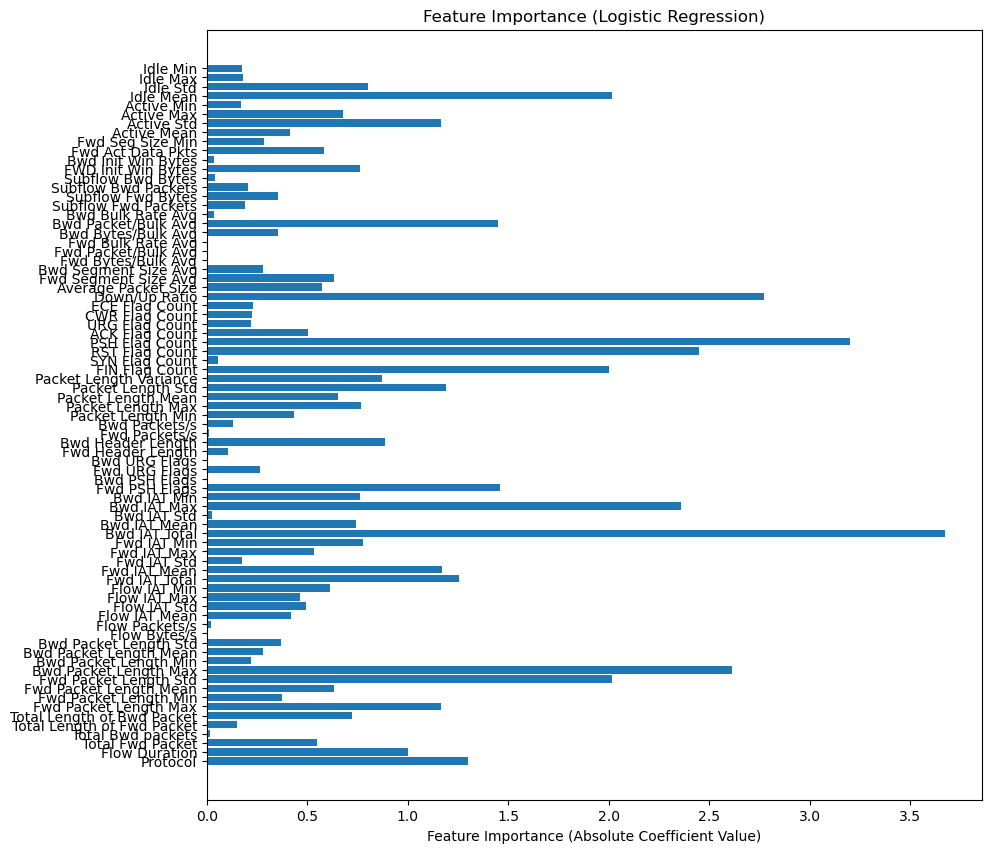

In [56]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'logreg2'  # Specify the model name

plt.figure(figsize=(10, 10))

# Access and process coefficients
importance_logreg = abs(models[model_name].coef_[0])  # Take absolute values
features = df.columns[:-1] # get the feature names.

# Visualization
plt.barh(features, importance_logreg)
plt.xlabel('Feature Importance (Absolute Coefficient Value)')
plt.title('Feature Importance (Logistic Regression)')
plt.show()

### logreg3

In [57]:
# Evaluate logreg3
model_name = 'logreg3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: logreg3
Accuracy: 0.9231689485577562
F1 Score: 0.8026447745716907
Precision: 0.7856042703462711
Recall: 0.8590009745373017
ROC AUC: 0.9891434501734571
Confusion Matrix:
 [[32  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  5  0 ... 49  0  0]
 [ 0  6  0 ...  0 58  4]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.84      0.86        38
           1       0.16      1.00      0.27         6
           2       0.88      1.00      0.94        22
           3       0.98      0.99      0.98       697
           4       0.98      0.98      0.98       126
           5       0.91      0.98      0.94       785
           6       0.99      0.94      0.96       974
           7       0.94      0.97      0.96       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.95      0.96      0.95     

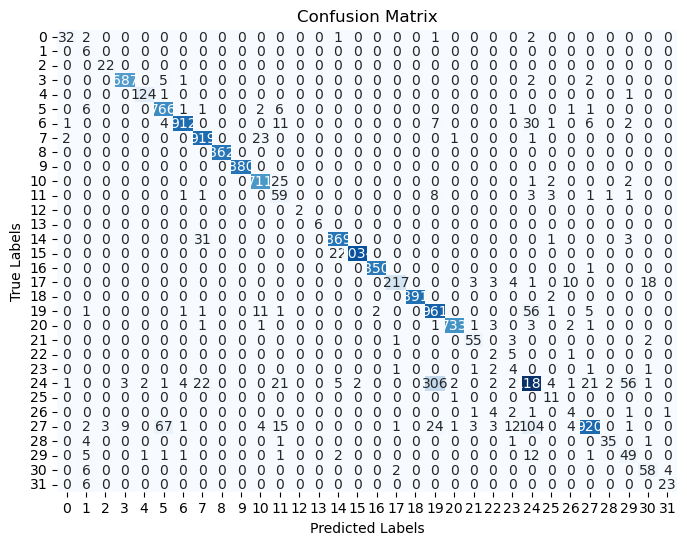

In [58]:
# Compute the confusion matrix
model_name = 'logreg3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

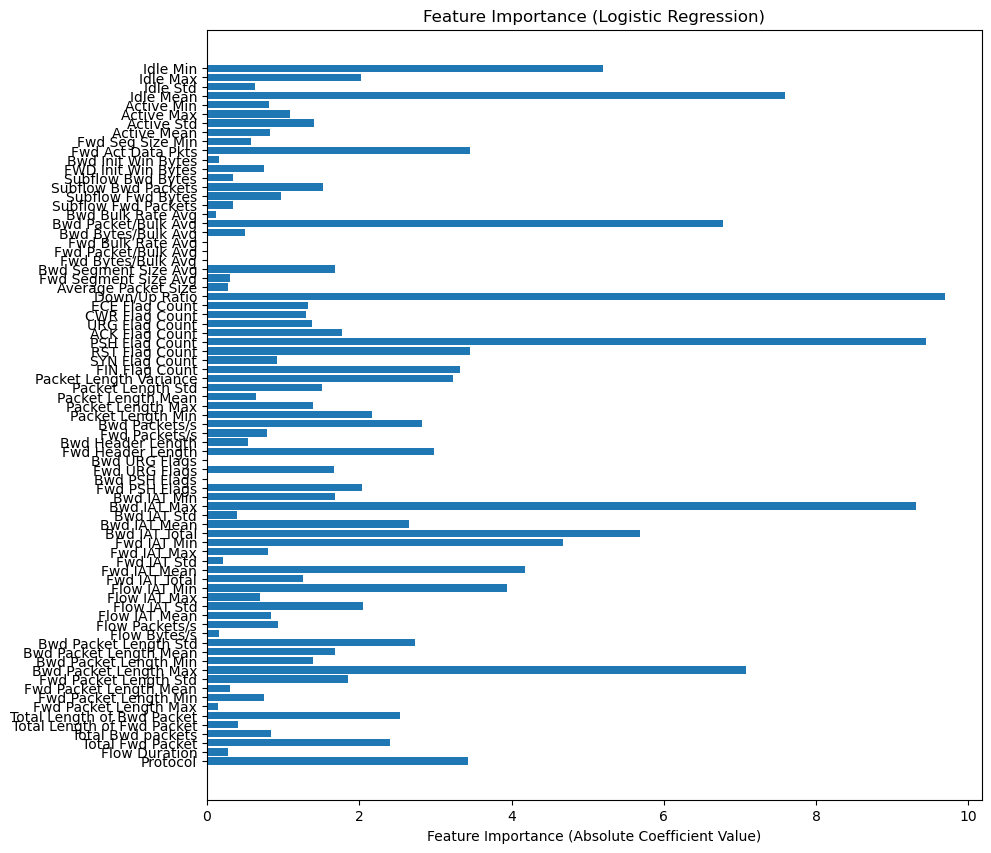

In [59]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'logreg3'  # Specify the model name

plt.figure(figsize=(10, 10))

# Access and process coefficients
importance_logreg = abs(models[model_name].coef_[0])  # Take absolute values
features = df.columns[:-1] # get the feature names.

# Visualization
plt.barh(features, importance_logreg)
plt.xlabel('Feature Importance (Absolute Coefficient Value)')
plt.title('Feature Importance (Logistic Regression)')
plt.show()

## **Gaussian Naive Bayes**

1. take really a short time compare to others model.
2. the least score

In [60]:
hyperparameters = [
    {},  # Default configuration
    {'var_smoothing': 1e-12},  # Minimal smoothing to let the model capture fine-grained variance, maximizing capacity.
    {'var_smoothing': 1e-3},  # Higher smoothing for more stability, especially with small datasets.
]

# Loop to create and train 3 models
for i in range(3):
    # Create and train the model (Gaussian Naive Bayes)
    model = GaussianNB(**hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'gnb{i+1}'] = model

# Print confirmation
print("Models trained and stored in the 'models' dictionary.")

Models trained and stored in the 'models' dictionary.


In [61]:
# Loop through the models gnb1, gnb2, gnb3, etc. (Gaussian Naive Bayes models)
for i in range(1, 4):
    model_name = f'gnb{i}'  # Changed from logreg to gnb
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: Unde

## **Result of Gaussian Naive Bayes**

### gnb1

In [62]:
# Evaluate gnb1
model_name = 'gnb1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: gnb1
Accuracy: 0.7847933005449953
F1 Score: 0.653806848908631
Precision: 0.7047315904653466
Recall: 0.7142989547080061
ROC AUC: 0.9587202764325912
Confusion Matrix:
 [[23  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 21 ...  0  0  0]
 ...
 [ 0  5  0 ... 18  0  0]
 [ 0  6  0 ...  0  0 20]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.61      0.72        38
           1       0.21      1.00      0.34         6
           2       1.00      0.95      0.98        22
           3       1.00      0.97      0.99       697
           4       0.83      0.98      0.90       126
           5       0.92      0.48      0.63       785
           6       0.65      0.92      0.76       974
           7       0.99      0.22      0.36       946
           8       0.89      1.00      0.94       862
           9       1.00      1.00      1.00       880
          10       0.94      1.00      0.97       74

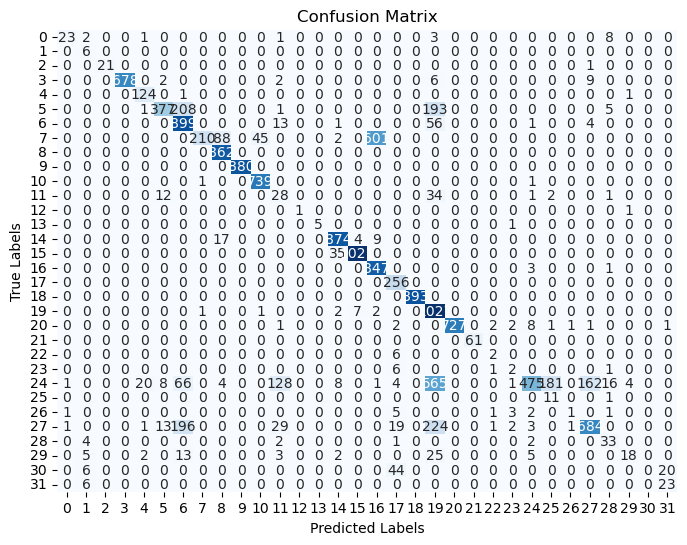

In [63]:
# Compute the confusion matrix
model_name = 'gnb1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

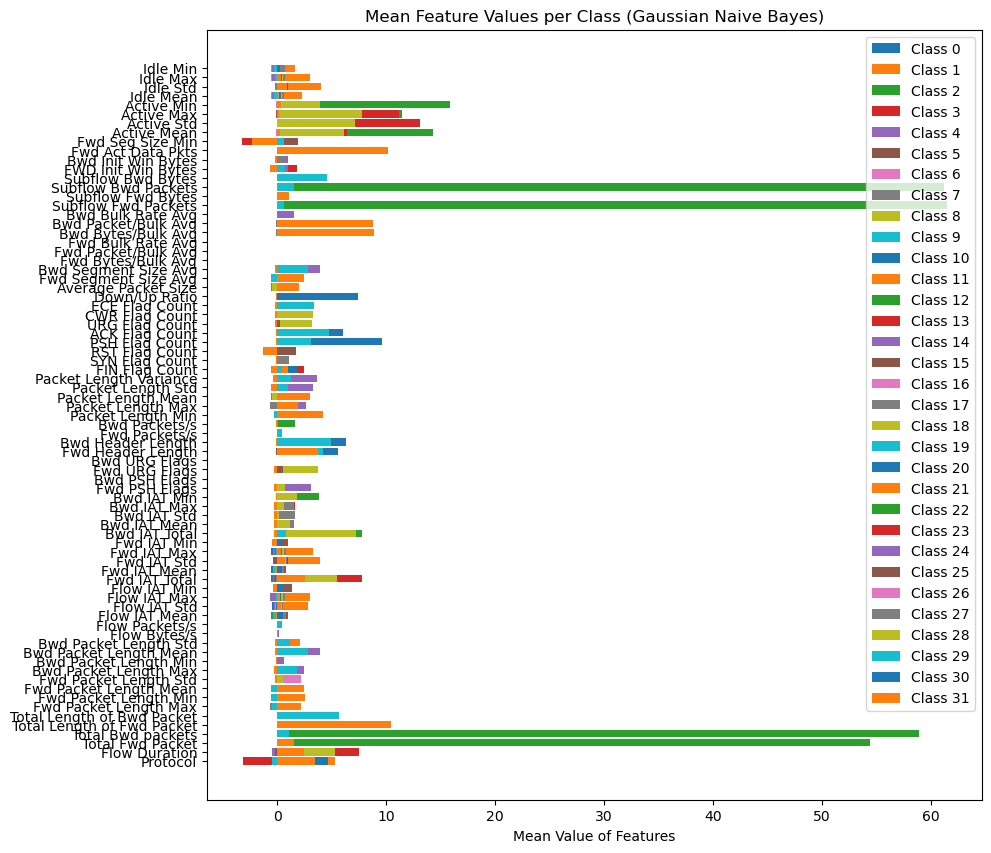

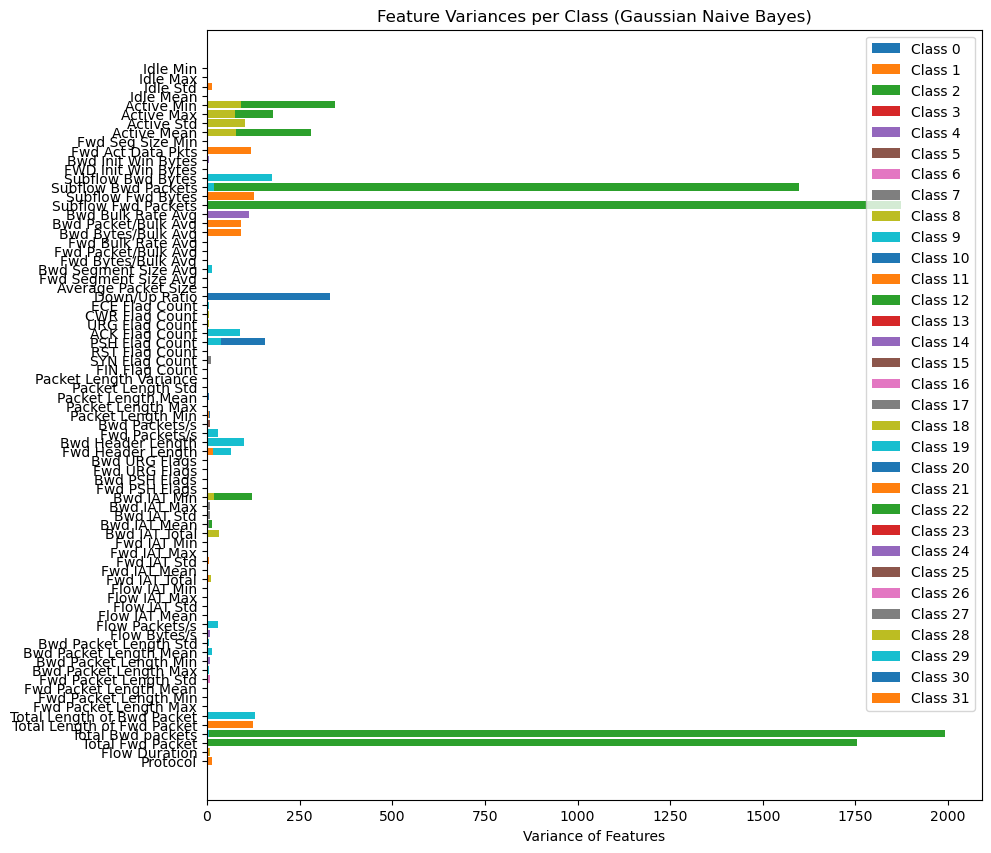

In [64]:
model_name = 'gnb1'  # Specify the model name
model = models[model_name]  # Access the GaussianNB model

# Get the mean and variance of each feature for each class
class_means = model.theta_  # Mean of each feature per class
class_variances = model.var_  # Variance of each feature per class
features = df.columns[:-1]  # Get the feature names (assuming the last column is the target)

# Number of classes and features
n_classes = class_means.shape[0]
n_features = class_means.shape[1]

# Plot the mean values of features for each class
plt.figure(figsize=(10, 10))

for i in range(n_classes):
    plt.barh(features, class_means[i], label=f'Class {i}')

plt.xlabel('Mean Value of Features')
plt.title('Mean Feature Values per Class (Gaussian Naive Bayes)')
plt.legend()
plt.show()

# Plot the variance values of features for each class
plt.figure(figsize=(10, 10))

for i in range(n_classes):
    plt.barh(features, class_variances[i], label=f'Class {i}')

plt.xlabel('Variance of Features')
plt.title('Feature Variances per Class (Gaussian Naive Bayes)')
plt.legend()
plt.show()

### gnb2

In [65]:
# Evaluate gnb2
model_name = 'gnb2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: gnb2
Accuracy: 0.7752891133856175
F1 Score: 0.6495805517483508
Precision: 0.7051807834406484
Recall: 0.7139685749048261
ROC AUC: 0.9577092472277048
Confusion Matrix:
 [[24  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 21 ...  0  0  0]
 ...
 [ 0  5  0 ... 18  0  0]
 [ 0  6  0 ...  0  0 20]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.63      0.75        38
           1       0.21      1.00      0.34         6
           2       1.00      0.95      0.98        22
           3       1.00      0.97      0.99       697
           4       0.82      0.98      0.90       126
           5       0.94      0.48      0.64       785
           6       0.71      0.92      0.80       974
           7       1.00      0.13      0.23       946
           8       0.69      1.00      0.82       862
           9       1.00      1.00      1.00       880
          10       0.91      1.00      0.95       7

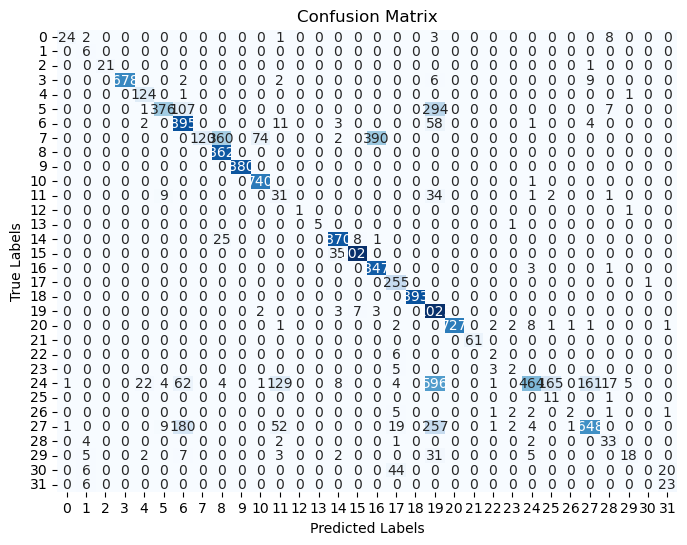

In [66]:
# Compute the confusion matrix
model_name = 'gnb2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

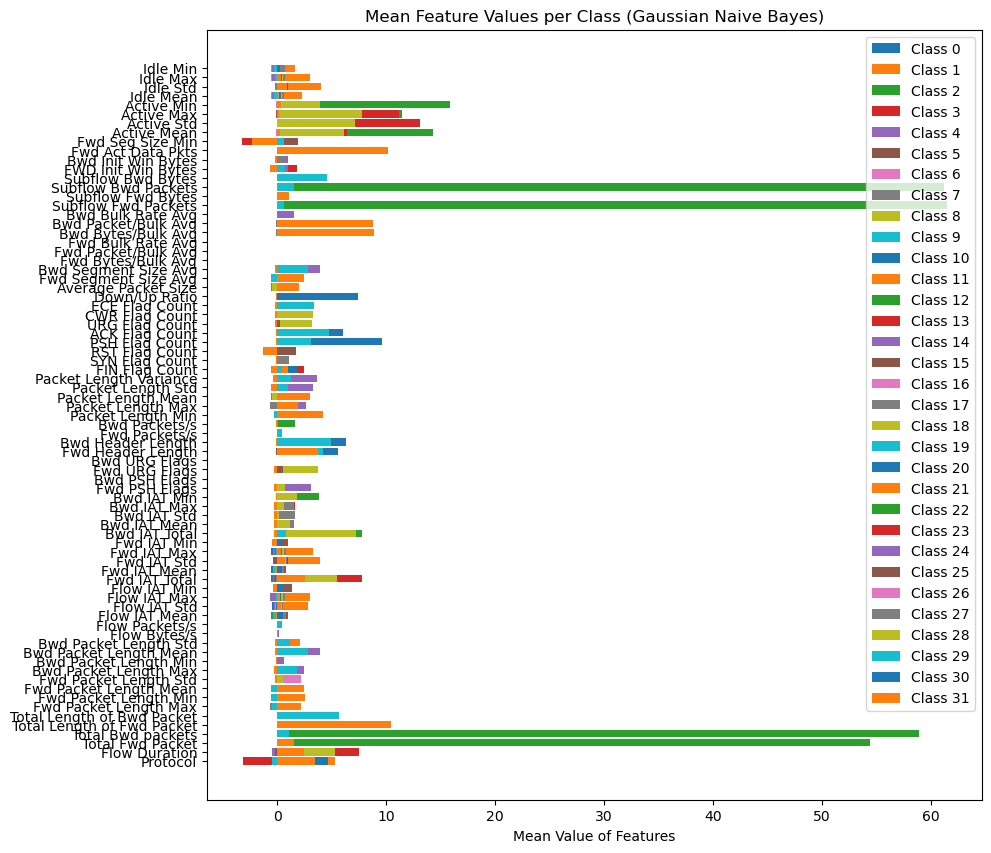

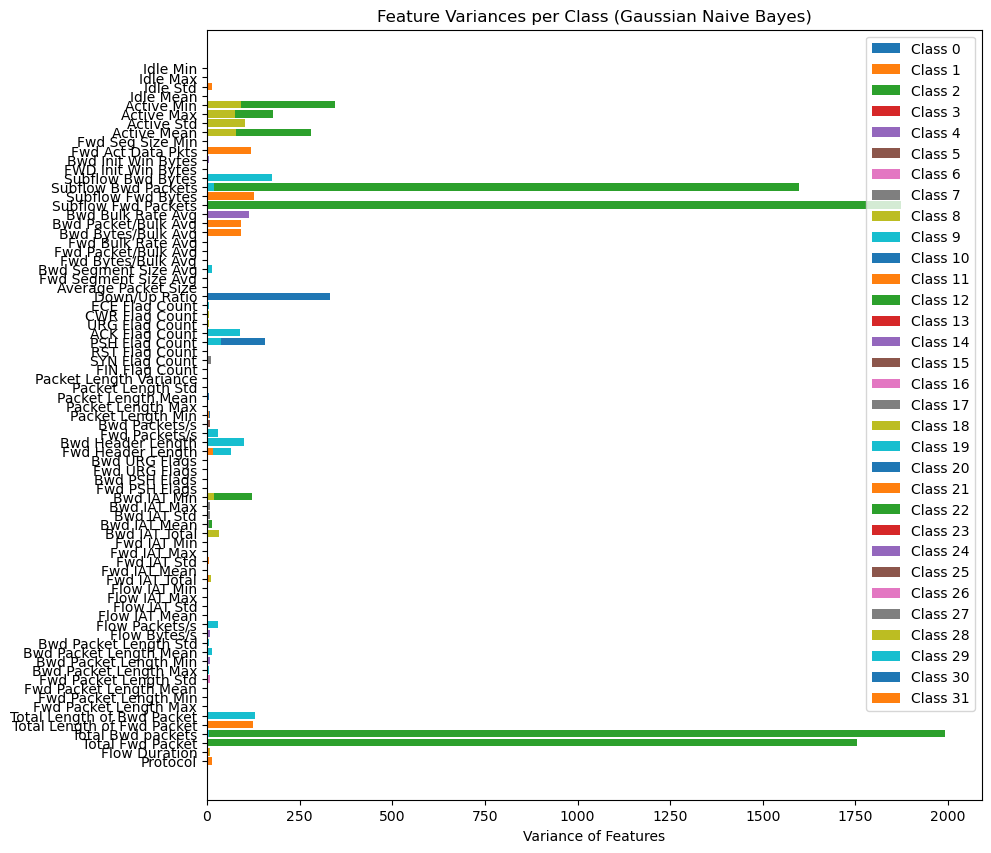

In [67]:
model_name = 'gnb2'  # Specify the model name
model = models[model_name]  # Access the GaussianNB model

# Get the mean and variance of each feature for each class
class_means = model.theta_  # Mean of each feature per class
class_variances = model.var_  # Variance of each feature per class
features = df.columns[:-1]  # Get the feature names (assuming the last column is the target)

# Number of classes and features
n_classes = class_means.shape[0]
n_features = class_means.shape[1]

# Plot the mean values of features for each class
plt.figure(figsize=(10, 10))

for i in range(n_classes):
    plt.barh(features, class_means[i], label=f'Class {i}')

plt.xlabel('Mean Value of Features')
plt.title('Mean Feature Values per Class (Gaussian Naive Bayes)')
plt.legend()
plt.show()

# Plot the variance values of features for each class
plt.figure(figsize=(10, 10))

for i in range(n_classes):
    plt.barh(features, class_variances[i], label=f'Class {i}')

plt.xlabel('Variance of Features')
plt.title('Feature Variances per Class (Gaussian Naive Bayes)')
plt.legend()
plt.show()

### gnb3

In [68]:
# Evaluate gnb3
model_name = 'gnb3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: gnb3
Accuracy: 0.5977668483317825
F1 Score: 0.5369672595676258
Precision: 0.6217530181864537
Recall: 0.5960998382720779
ROC AUC: 0.9419986205488551
Confusion Matrix:
 [[22  3  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 21 ...  0  0  0]
 ...
 [ 0  5  0 ... 11  0  0]
 [ 0  6  0 ...  0  0 20]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.58      0.71        38
           1       0.08      1.00      0.14         6
           2       0.53      0.95      0.68        22
           3       0.95      0.98      0.96       697
           4       0.89      0.98      0.93       126
           5       0.85      0.48      0.62       785
           6       0.41      0.94      0.57       974
           7       0.54      0.11      0.18       946
           8       0.97      0.70      0.82       862
           9       1.00      0.70      0.83       880
          10       0.74      0.67      0.70       7

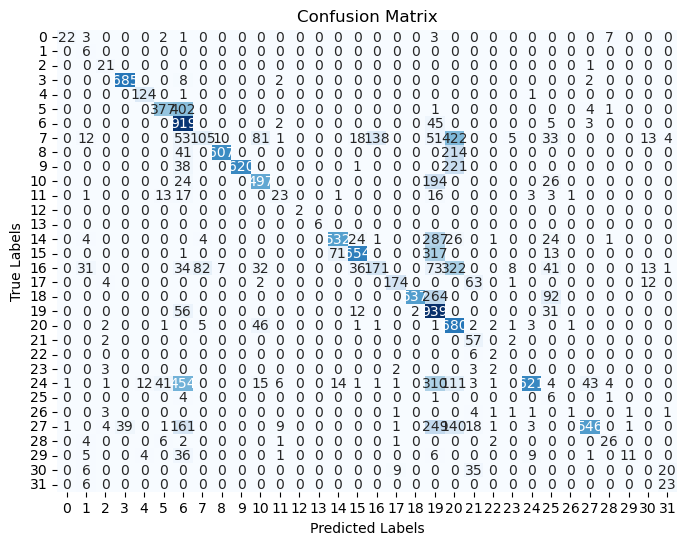

In [69]:
# Compute the confusion matrix
model_name = 'gnb3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

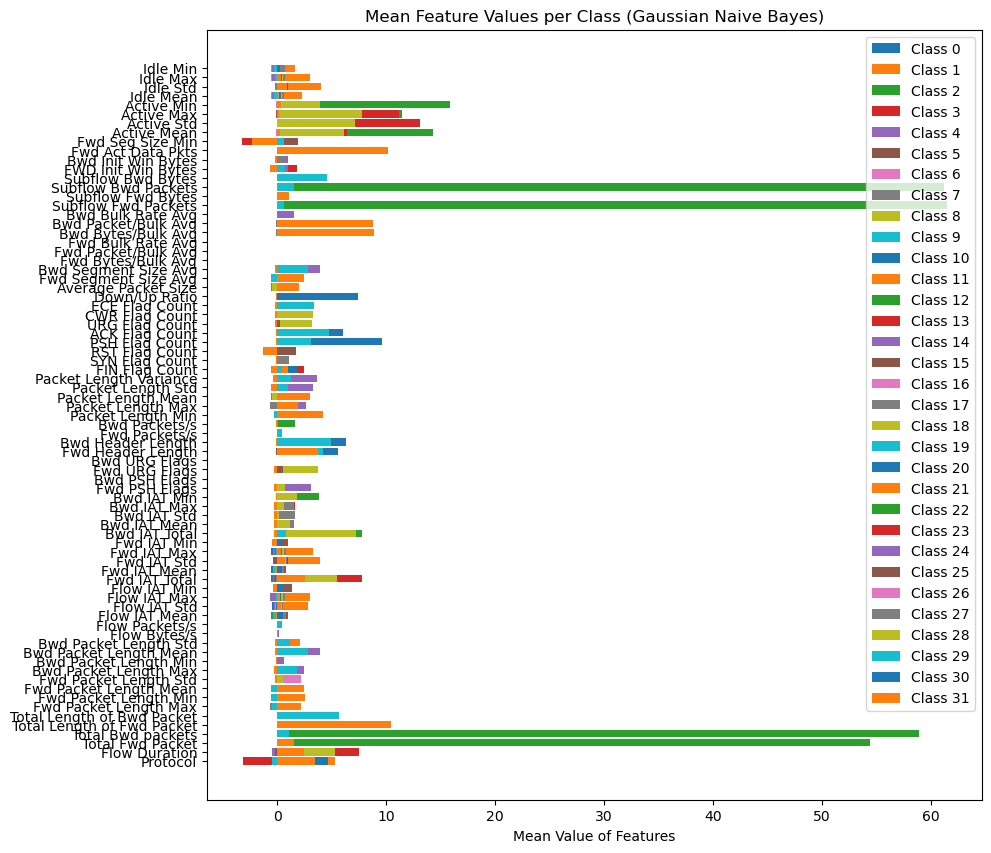

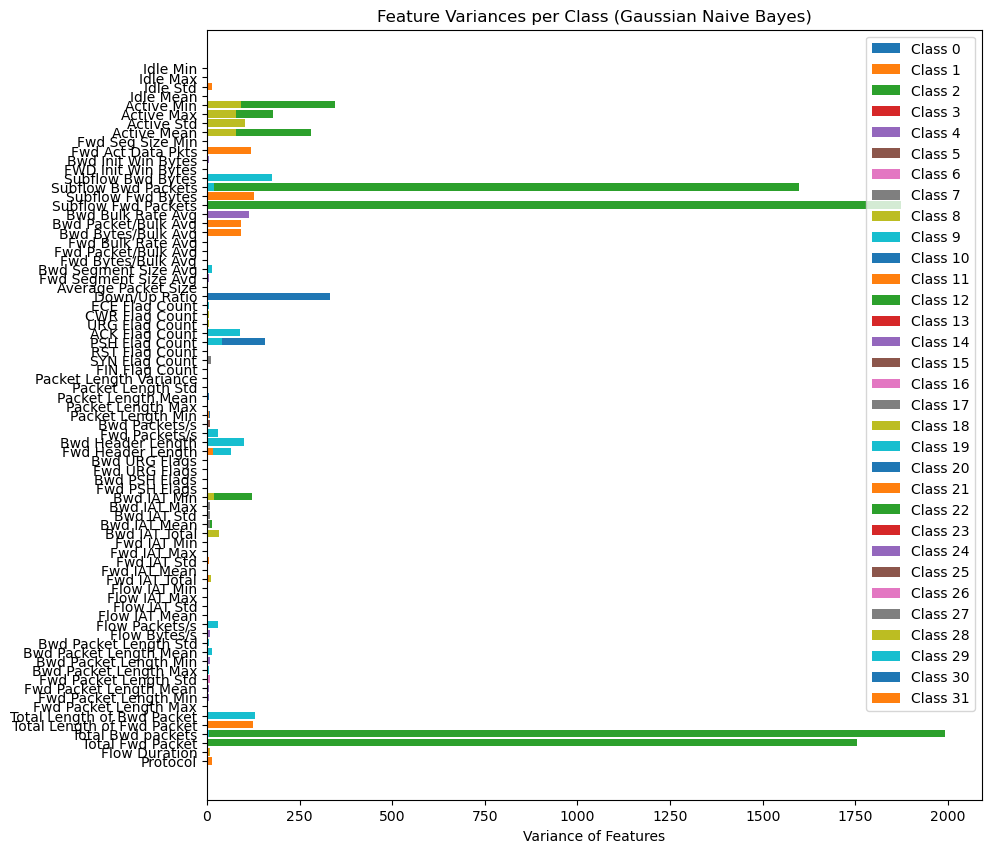

In [70]:
model_name = 'gnb3'  # Specify the model name
model = models[model_name]  # Access the GaussianNB model

# Get the mean and variance of each feature for each class
class_means = model.theta_  # Mean of each feature per class
class_variances = model.var_  # Variance of each feature per class
features = df.columns[:-1]  # Get the feature names (assuming the last column is the target)

# Number of classes and features
n_classes = class_means.shape[0]
n_features = class_means.shape[1]

# Plot the mean values of features for each class
plt.figure(figsize=(10, 10))

for i in range(n_classes):
    plt.barh(features, class_means[i], label=f'Class {i}')

plt.xlabel('Mean Value of Features')
plt.title('Mean Feature Values per Class (Gaussian Naive Bayes)')
plt.legend()
plt.show()

# Plot the variance values of features for each class
plt.figure(figsize=(10, 10))

for i in range(n_classes):
    plt.barh(features, class_variances[i], label=f'Class {i}')

plt.xlabel('Variance of Features')
plt.title('Feature Variances per Class (Gaussian Naive Bayes)')
plt.legend()
plt.show()

## **XGBoost (Exetreme Gradient Boosting)**

1. low time spend on the process and get great result

In [71]:
# Hyperparameters for XGBoost
hyperparameters = [
    {'n_estimators': 30, 'max_depth': 2, 'min_child_weight': 15, 'learning_rate': 0.3, 'subsample': 0.8}, # Lower number of estimators, deeper tree, moderate learning rate.
    {'n_estimators': 40, 'max_depth': 2, 'min_child_weight': 20, 'learning_rate': 0.25, 'subsample': 0.8}, # Slightly more trees and reduced learning rate for better generalization.
    {'n_estimators': 50, 'max_depth': 2, 'min_child_weight': 25, 'learning_rate': 0.2, 'subsample': 0.8}  # Increased trees, further reduced learning rate for more cautious learning.
]

# Loop to create and train 3 models
for i in range(3):
    # Create and train the model
    model = XGBClassifier(random_state=42, verbosity=0, **hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'xgb{i+1}'] = model

# Print confirmation
print("Models trained and stored in the 'models' dictionary.")

Models trained and stored in the 'models' dictionary.


In [72]:
# Loop through the models xgb1, xgb2, xgb3, etc. (XGBoost models)
for i in range(1, 4):
    model_name = f'xgb{i}'  # Changed from gnb to xgb
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

## **Result of XGBoost**

### xgb1

In [73]:
# Evaluate xgb1
model_name = 'xgb1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: xgb1
Accuracy: 0.9752758208161638
F1 Score: 0.8616901920044902
Precision: 0.8499153600793787
Recall: 0.8991779213088993
ROC AUC: 0.9993938594507389
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  3  0 ... 66  0  0]
 [ 0  1  0 ...  0 68  1]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.89      0.89        38
           1       0.55      1.00      0.71         6
           2       0.92      1.00      0.96        22
           3       1.00      0.99      1.00       697
           4       1.00      0.99      1.00       126
           5       0.95      0.99      0.97       785
           6       1.00      0.95      0.97       974
           7       0.99      0.97      0.98       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.96      1.00      0.98       7

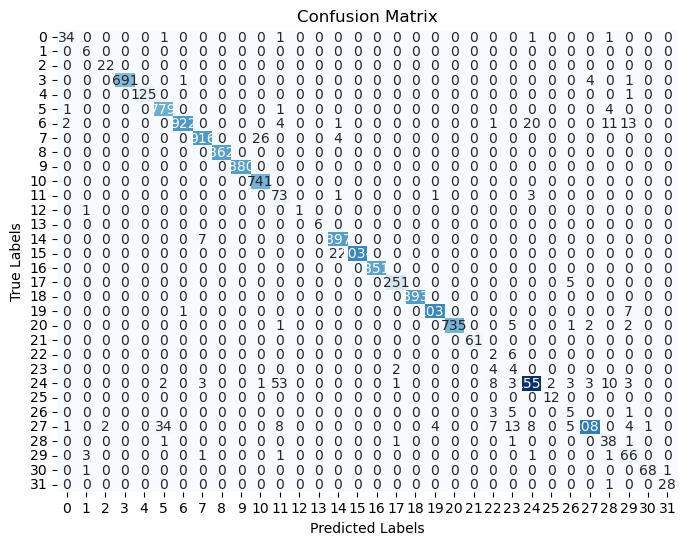

In [74]:
# Compute the confusion matrix
model_name = 'xgb1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

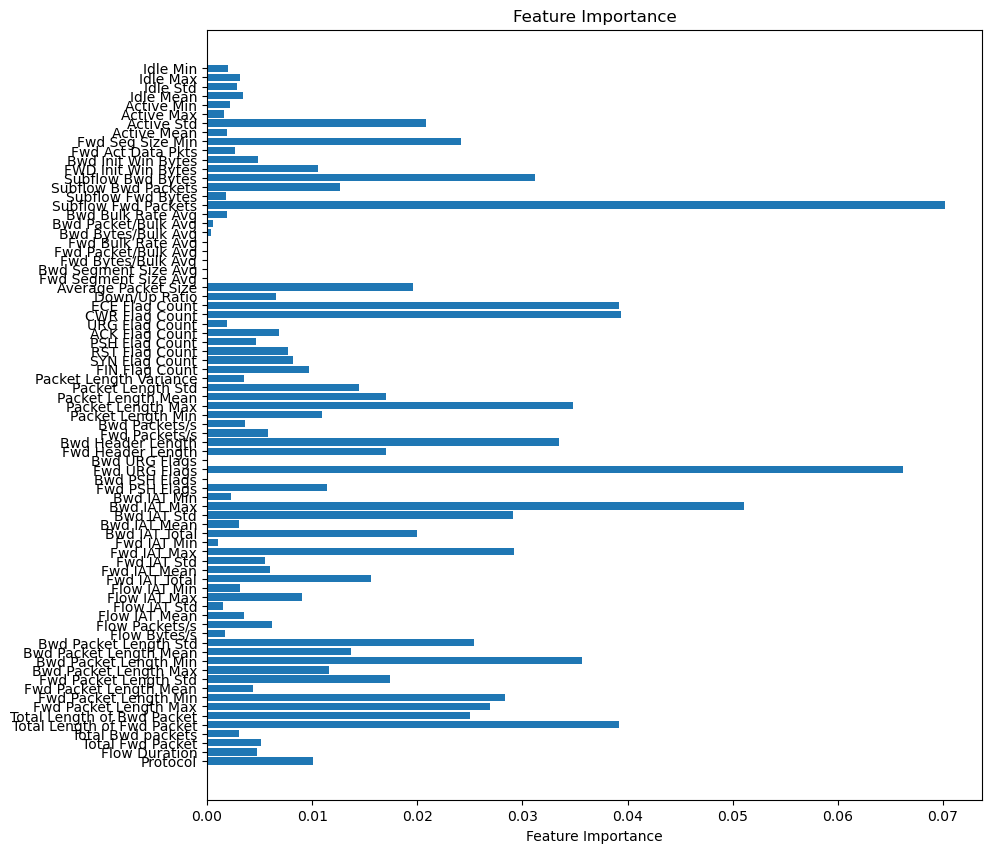

In [75]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'xgb1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### xgb2

In [76]:
# Evaluate xgb2
model_name = 'xgb2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: xgb2
Accuracy: 0.9783331117905091
F1 Score: 0.86967964994948
Precision: 0.8646465181428411
Recall: 0.8953262279512193
ROC AUC: 0.9994614393770825
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  3  0 ... 66  0  0]
 [ 0  1  0 ...  0 69  0]
 [ 0  0  0 ...  0  1 27]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93        38
           1       0.55      1.00      0.71         6
           2       0.92      1.00      0.96        22
           3       1.00      0.99      1.00       697
           4       1.00      0.99      1.00       126
           5       0.99      1.00      0.99       785
           6       1.00      0.95      0.97       974
           7       0.97      0.98      0.97       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.97      1.00      0.98       741

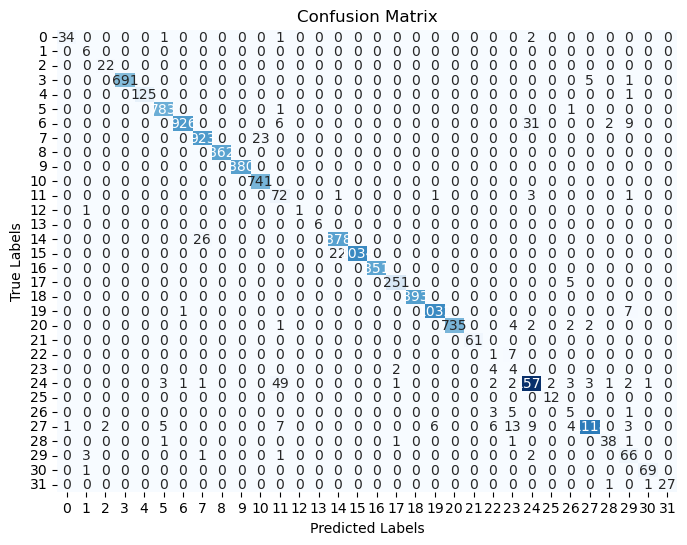

In [77]:
# Compute the confusion matrix
model_name = 'xgb2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

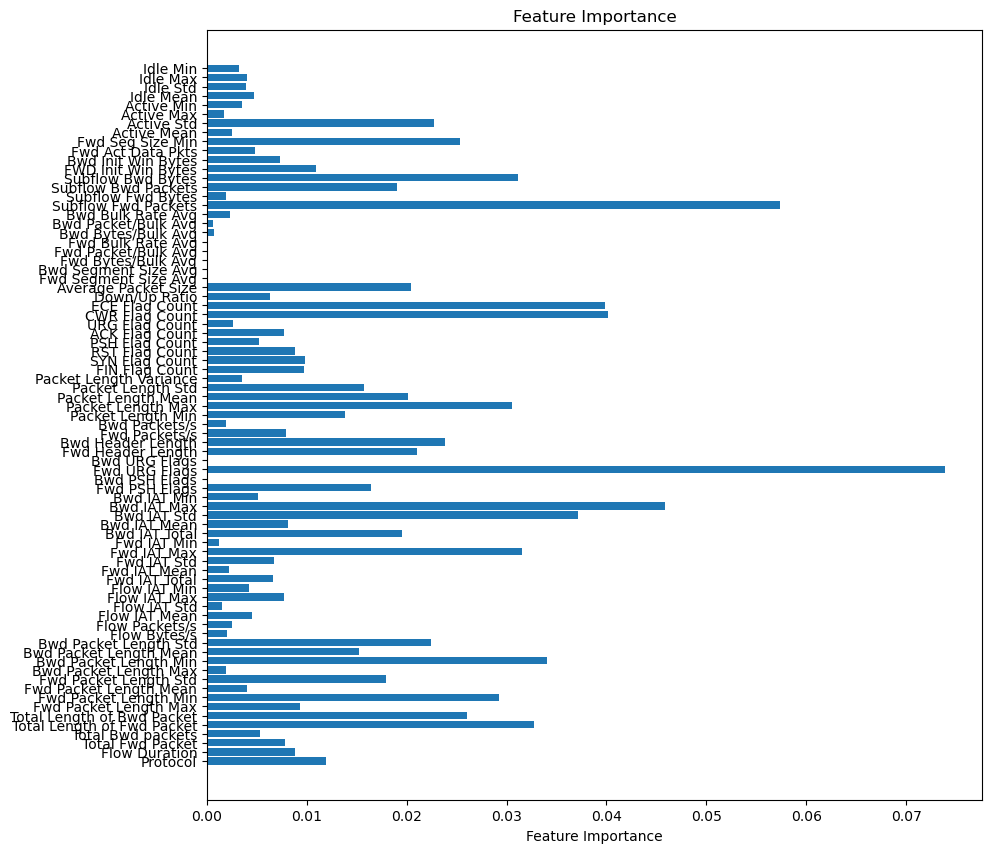

In [78]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'xgb2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### xgb3

In [79]:
# Evaluate xgb3
model_name = 'xgb3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: xgb3
Accuracy: 0.9782666489432408
F1 Score: 0.8707640777628356
Precision: 0.8640621217213043
Recall: 0.8972697348958871
ROC AUC: 0.9995007333405976
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  2  0 ... 65  1  1]
 [ 0  1  0 ...  0 67  2]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.89      0.93        38
           1       0.60      1.00      0.75         6
           2       0.92      1.00      0.96        22
           3       1.00      0.99      1.00       697
           4       1.00      0.99      1.00       126
           5       0.99      1.00      0.99       785
           6       1.00      0.95      0.97       974
           7       0.97      0.97      0.97       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.97      1.00      0.98       7

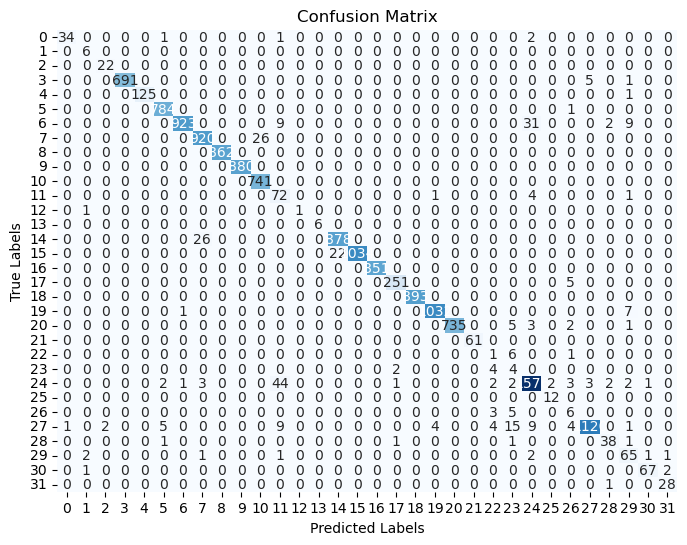

In [80]:
# Compute the confusion matrix
model_name = 'xgb3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

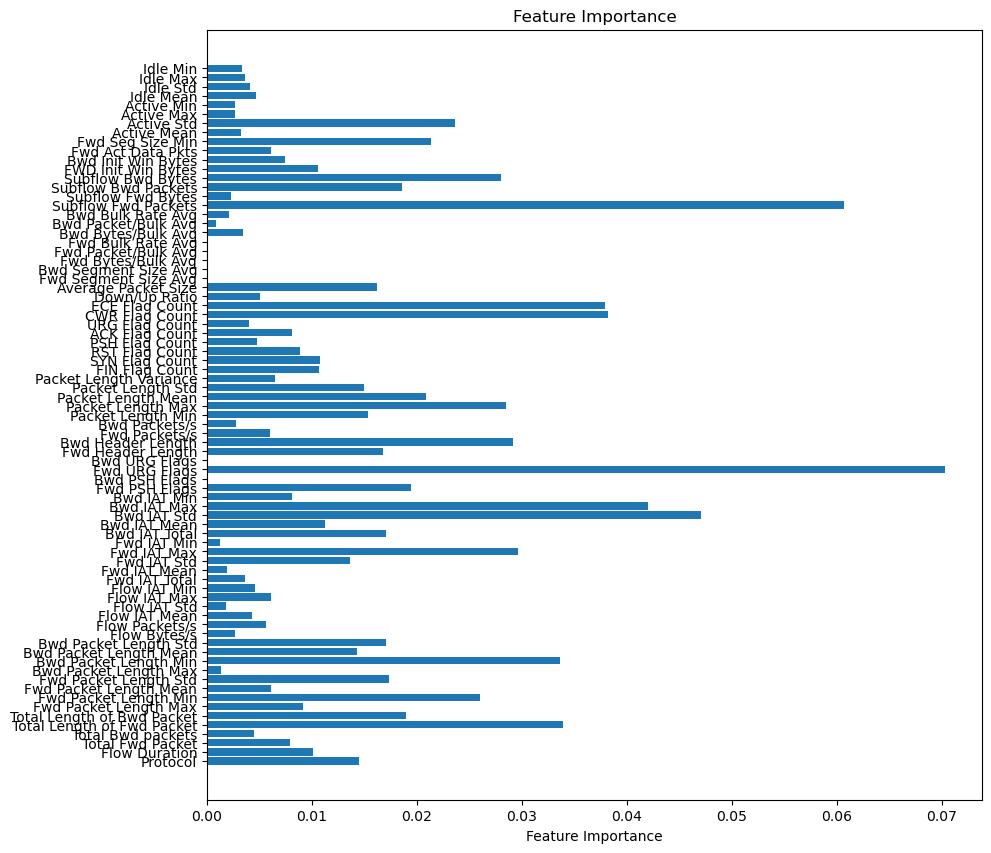

In [81]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'xgb3'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

## **K-Nearest Neighbor (KNN)**

In [82]:
hyperparameters = [
    {'n_neighbors': 5, 'weights': 'uniform', 'p': 2},  # a simple and fast model.
    {'n_neighbors': 10, 'weights': 'distance', 'p': 2},  # gives more importance to closer neighbors.
    {'n_neighbors': 15, 'weights': 'uniform', 'p': 1}  # a smoother model with a different distance metric.
]

# Loop to create and train 3 KNN models
for i in range(3):
    # Create and train the model
    model = KNeighborsClassifier(**hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'knn{i+1}'] = model

# Print confirmation
print("model trained and stored in the 'models' dictionary.")

model trained and stored in the 'models' dictionary.


In [83]:
for i in range(1, 4):
    model_name = f'knn{i}'  
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

## **Result of K-Nearest Neighbor**

### knn1

In [84]:
# Evaluate knn1
model_name = 'knn1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: knn1
Accuracy: 0.9621826399042935
F1 Score: 0.8472468720062412
Precision: 0.833760326517839
Recall: 0.8701392017696408
ROC AUC: 0.9500429870242797
Confusion Matrix:
 [[33  0  0 ...  0  0  0]
 [ 1  4  0 ...  1  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 64  0  0]
 [ 0  0  0 ...  0 59 11]
 [ 0  0  0 ...  0  7 21]]
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.87      0.77        38
           1       0.80      0.67      0.73         6
           2       0.88      1.00      0.94        22
           3       0.99      0.99      0.99       697
           4       1.00      0.99      1.00       126
           5       0.94      0.96      0.95       785
           6       0.97      0.95      0.96       974
           7       0.92      0.91      0.92       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.99      0.99      0.99       74

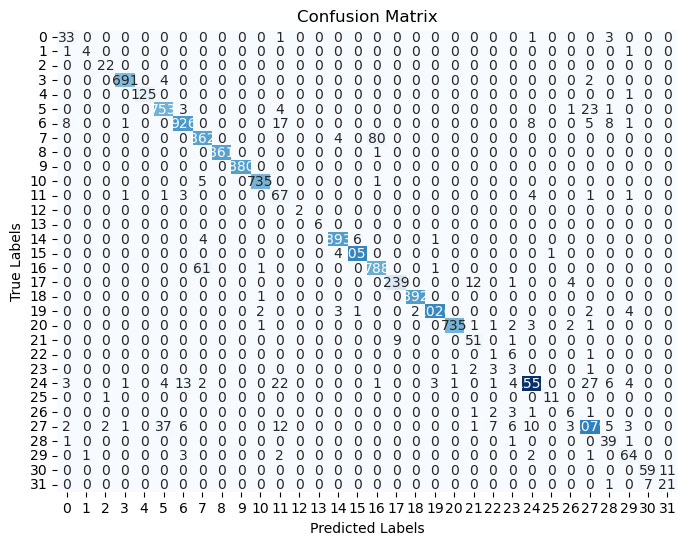

In [85]:
# Compute the confusion matrix
model_name = 'knn1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

### knn2

In [86]:
# Evaluate knn2
model_name = 'knn2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: knn2
Accuracy: 0.9657051708095175
F1 Score: 0.8542050184086982
Precision: 0.8400436442270165
Recall: 0.877897600175672
ROC AUC: 0.9582306382541457
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 1  4  0 ...  1  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 65  0  0]
 [ 0  0  0 ...  0 57 13]
 [ 0  0  0 ...  0  6 22]]
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.89      0.78        38
           1       0.67      0.67      0.67         6
           2       0.96      1.00      0.98        22
           3       1.00      0.99      0.99       697
           4       0.99      0.99      0.99       126
           5       0.94      0.97      0.95       785
           6       0.98      0.95      0.96       974
           7       0.94      0.92      0.93       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.99      0.99      0.99       74

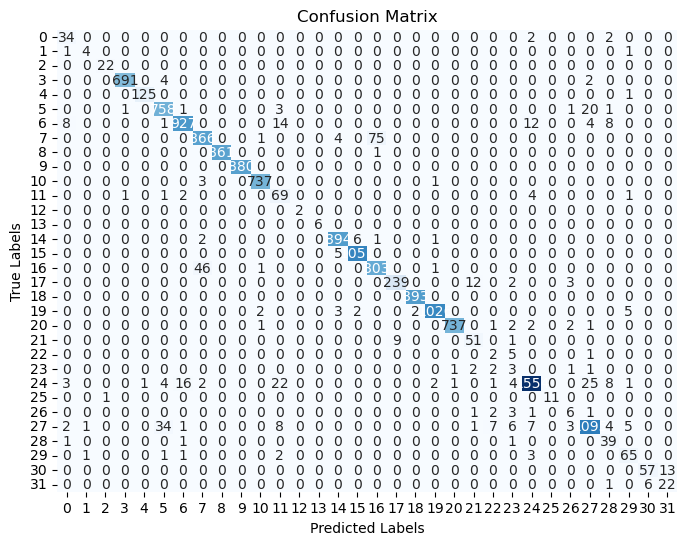

In [87]:
# Compute the confusion matrix
model_name = 'knn2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

### knn3

In [88]:
# Evaluate knn3
model_name = 'knn3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: knn3
Accuracy: 0.9534095440648678
F1 Score: 0.8480231672934712
Precision: 0.8288655907174084
Recall: 0.8830684920290186
ROC AUC: 0.9680196651360549
Confusion Matrix:
 [[33  0  0 ...  0  0  0]
 [ 1  5  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 65  0  0]
 [ 0  0  0 ...  0 58 12]
 [ 0  0  0 ...  0  5 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.87      0.77        38
           1       0.83      0.83      0.83         6
           2       0.88      1.00      0.94        22
           3       1.00      0.99      0.99       697
           4       1.00      1.00      1.00       126
           5       0.94      0.97      0.95       785
           6       0.99      0.95      0.97       974
           7       0.88      0.89      0.88       946
           8       1.00      0.99      0.99       862
           9       1.00      0.98      0.99       880
          10       0.98      0.99      0.98       7

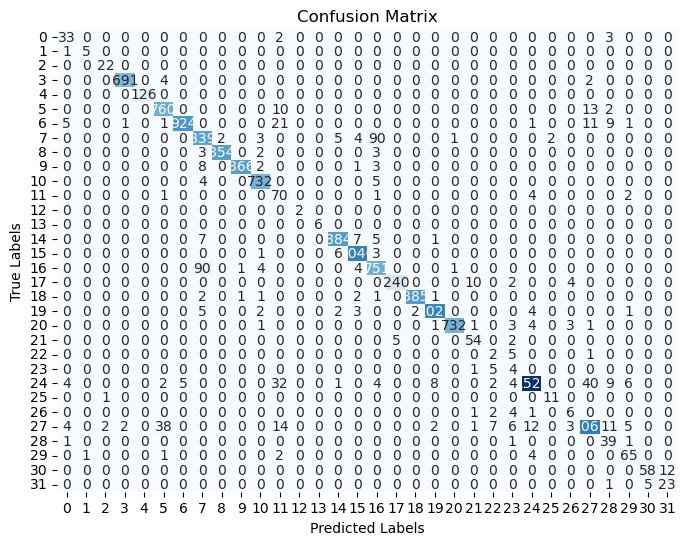

In [89]:
# Compute the confusion matrix
model_name = 'knn3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

## **LightGBM (Light Gradient Boosting)**

In [90]:
hyperparameters = [
    {'n_estimators': 30, 'max_depth': 2, 'min_child_weight': 15, 'learning_rate': 0.3, 'subsample': 0.8},  # Lower number of estimators, shallow trees, moderate learning rate
    {'n_estimators': 40, 'max_depth': 2, 'min_child_weight': 20, 'learning_rate': 0.25, 'subsample': 0.8},  # Slightly more trees, increased min_child_weight, reduced learning rate
    {'n_estimators': 50, 'max_depth': 2, 'min_child_weight': 25, 'learning_rate': 0.2, 'subsample': 0.8}   # Increased trees, further increased min_child_weight, further reduced learning rate
]

# Loop to create and train 3 LightGBM models
for i in range(3):
    # Create and train the model
    model = LGBMClassifier(random_state=42, **hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'lgbm{i+1}'] = model

# Print confirmation
print("LightGBM models trained and stored in the 'models' dictionary.")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17616
[LightGBM] [Info] Number of data points in the train set: 210400, number of used features: 72
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.465736
[LightGBM] [Info] Start training from score -3.4657

In [91]:
for i in range(1, 4):
    model_name = f'lgbm{i}'  
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: Unde

## **Result of LightGBM**

### lgbm1

In [92]:
# Evaluate lgbm1
model_name = 'lgbm1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: lgbm1
Accuracy: 0.6006912136115912
F1 Score: 0.36901145332358687
Precision: 0.3477643302269745
Recall: 0.4775215022757107
ROC AUC: 0.9131801906228214
Confusion Matrix:
 [[21  1  0 ...  1  0  2]
 [ 0  6  0 ...  0  0  0]
 [ 0  0  0 ...  1  0  0]
 ...
 [ 2  5  0 ... 25  0  0]
 [ 3  5  0 ...  0 10 11]
 [ 0  2  0 ...  0  0 26]]
Classification Report:
               precision    recall  f1-score   support

           0       0.09      0.55      0.15        38
           1       0.25      1.00      0.40         6
           2       0.00      0.00      0.00        22
           3       0.32      0.98      0.48       697
           4       0.54      0.77      0.63       126
           5       0.00      0.00      0.00       785
           6       0.83      0.52      0.64       974
           7       0.00      0.00      0.00       946
           8       0.89      0.97      0.93       862
           9       0.98      0.96      0.97       880
          10       0.91      0.95      0.93      

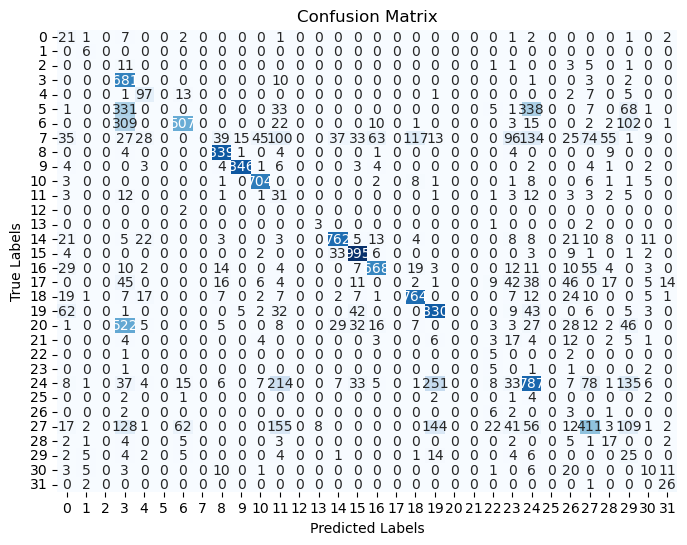

In [93]:
# Compute the confusion matrix
model_name = 'lgbm1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

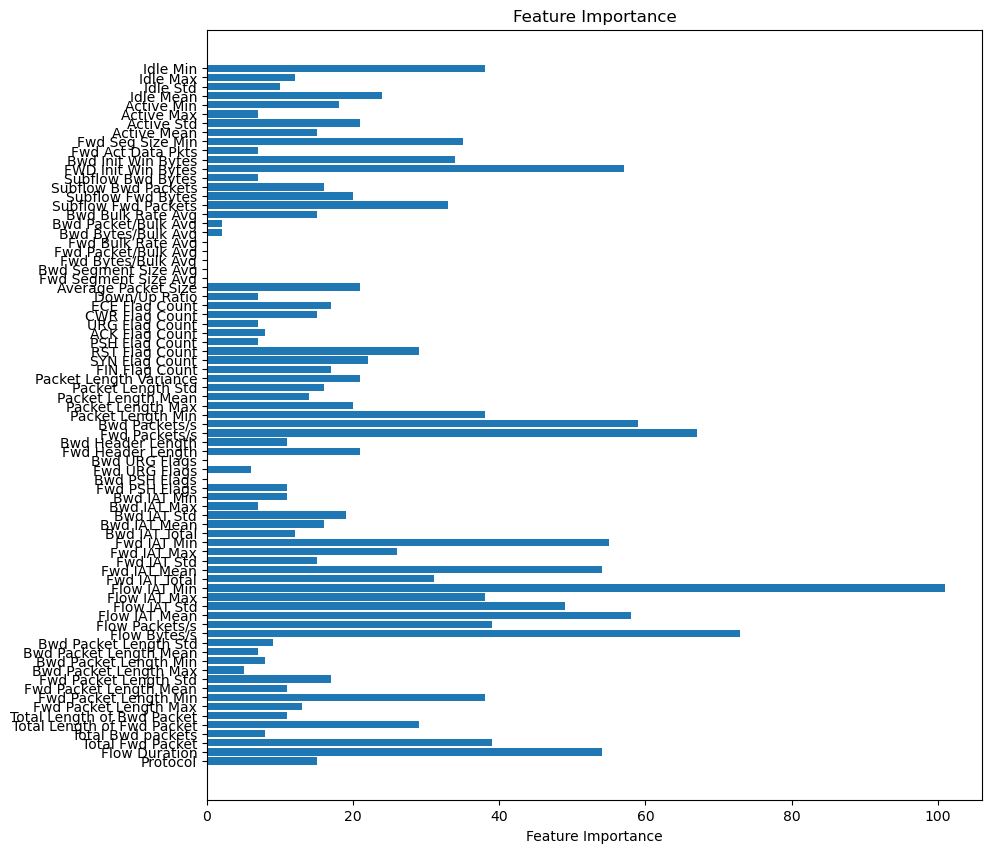

In [94]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'lgbm1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

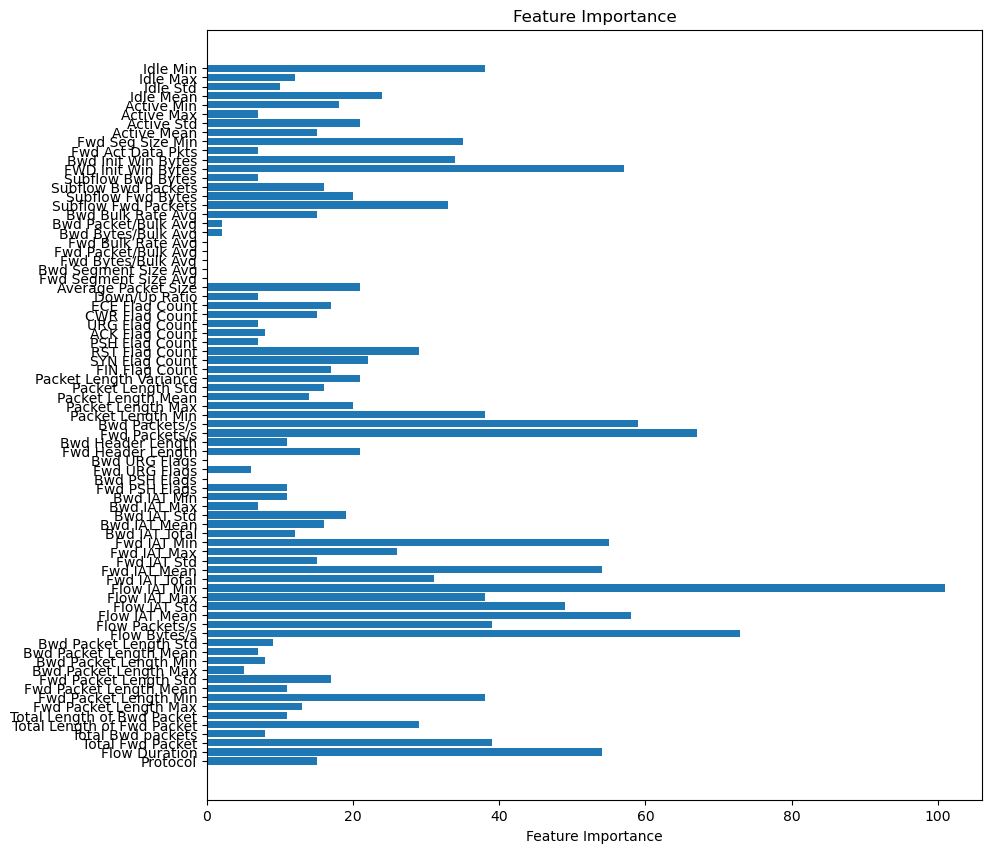

In [95]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'lgbm1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### lgbm2

In [96]:
# Evaluate lgbm2
model_name = 'lgbm2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: lgbm2
Accuracy: 0.9828525854047587
F1 Score: 0.8785884289050347
Precision: 0.8665262388879722
Recall: 0.9116108410681997
ROC AUC: 0.9992772206321973
Confusion Matrix:
 [[34  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  1  0 ... 67  1  0]
 [ 0  1  0 ...  1 67  1]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.89      0.83        38
           1       0.67      1.00      0.80         6
           2       0.92      1.00      0.96        22
           3       1.00      0.99      1.00       697
           4       1.00      0.98      0.99       126
           5       0.99      0.99      0.99       785
           6       0.98      0.97      0.98       974
           7       0.99      0.99      0.99       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       1.00      1.00      1.00       

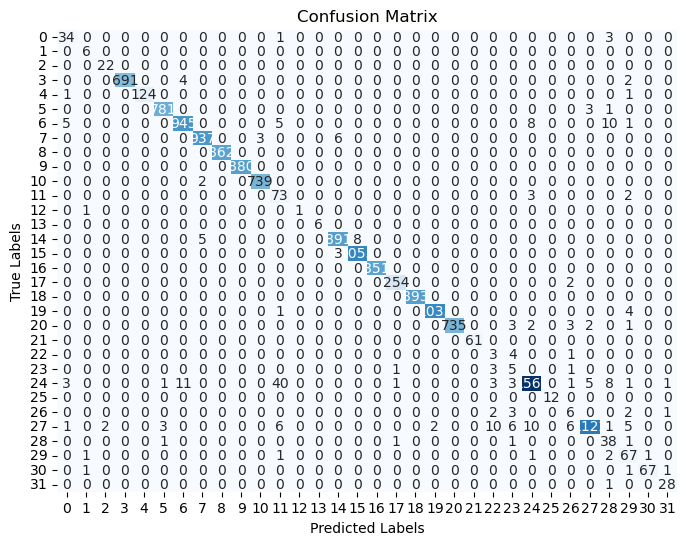

In [97]:
# Compute the confusion matrix
model_name = 'lgbm2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

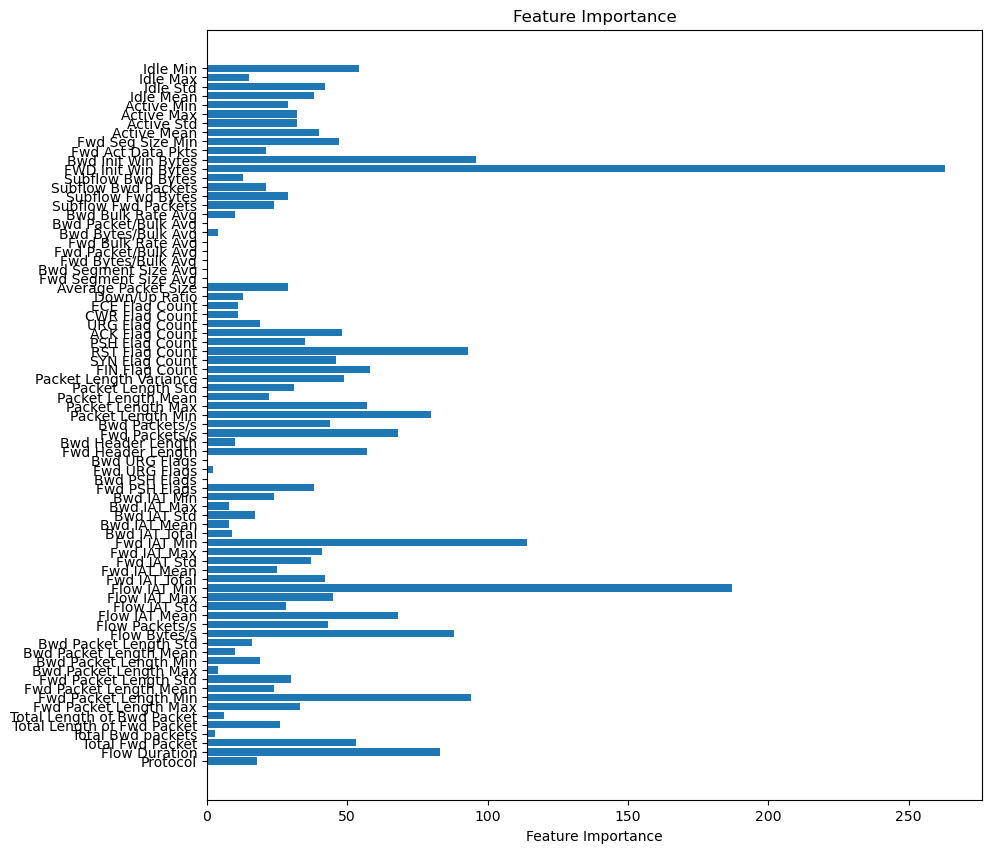

In [98]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'lgbm2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

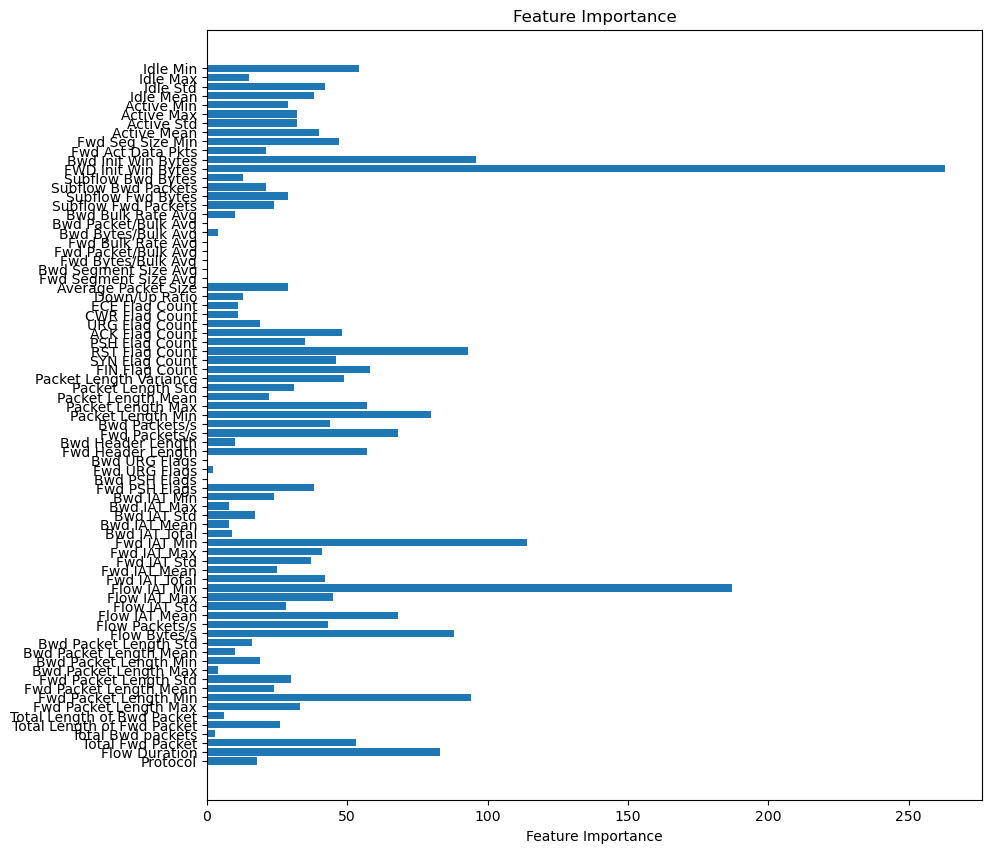

In [99]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'lgbm2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### lgbm3

In [100]:
# Evaluate lgbm3
model_name = 'lgbm3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: lgbm3
Accuracy: 0.9819885683902698
F1 Score: 0.8691179940689084
Precision: 0.859156548292288
Recall: 0.898537530849379
ROC AUC: 0.9995829464038553
Confusion Matrix:
 [[35  0  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  2  0 ... 66  1  0]
 [ 0  1  0 ...  1 67  1]
 [ 0  0  0 ...  0  0 28]]
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.92      0.84        38
           1       0.60      1.00      0.75         6
           2       0.92      1.00      0.96        22
           3       1.00      0.99      1.00       697
           4       1.00      0.98      0.99       126
           5       0.99      0.99      0.99       785
           6       0.99      0.97      0.98       974
           7       0.99      0.99      0.99       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.99      1.00      0.99       74

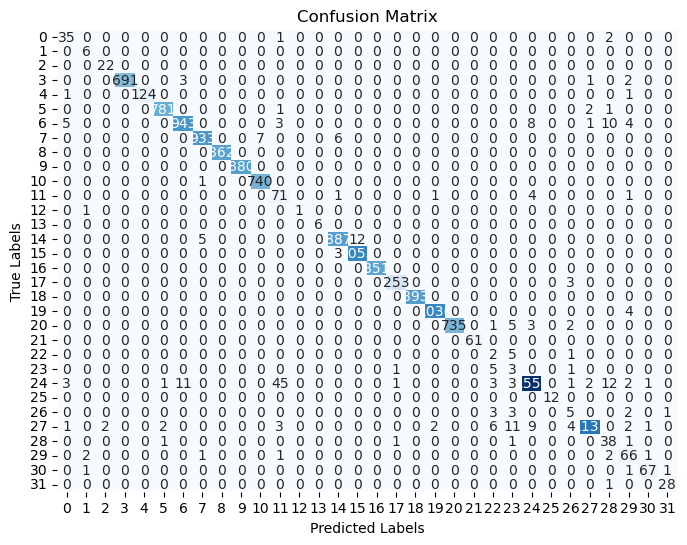

In [101]:
# Compute the confusion matrix
model_name = 'lgbm3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

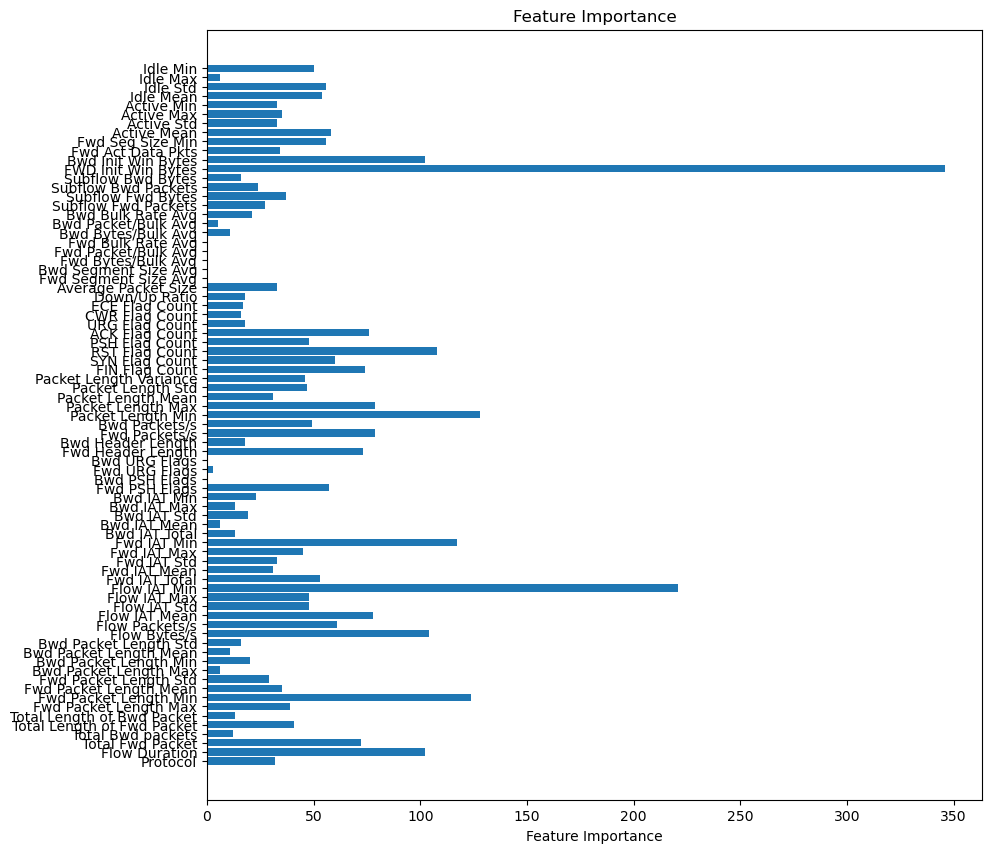

In [102]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'lgbm3'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

## **Adaboost (Adaptive Boosting)**

In [103]:
hyperparameters = [
    {'n_estimators': 30, 'learning_rate': 0.3}, # Lower number of estimators, moderate learning rate
    {'n_estimators': 50, 'learning_rate': 0.2}, # Increased estimators, further reduced learning rate
    {'n_estimators': 100, 'learning_rate': 0.05} # Even more estimators, further reduced learning rate
]

# Loop to create and train 3 AdaBoost models
for i in range(3):
    # Create and train the model
    model = AdaBoostClassifier(random_state=42, **hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'adab{i+1}'] = model

# Print confirmation
print("Models trained and stored in the 'models' dictionary.")

d:\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
d:\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
d:\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Models trained and stored in the 'models' dictionary.


In [104]:
for i in range(1, 4):
    model_name = f'adab{i}'  
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
d:\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: Unde

## **Result of Adaboost**

### adab1

In [105]:
# Evaluate adab1
model_name = 'adab1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: adab1
Accuracy: 0.3283929283530506
F1 Score: 0.18953507404106765
Precision: 0.20501556516966565
Recall: 0.2650235798531474
ROC AUC: 0.9327169649672662
Confusion Matrix:
 [[12  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  5  0 ... 15  0  0]
 [ 0  6  0 ...  0  0 14]
 [ 0  6  0 ...  0  0 16]]
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.32      0.41        38
           1       0.21      1.00      0.34         6
           2       0.00      0.00      0.00        22
           3       0.00      0.00      0.00       697
           4       0.00      0.00      0.00       126
           5       0.00      0.00      0.00       785
           6       0.00      0.00      0.00       974
           7       0.33      0.02      0.03       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.00      0.00      0.00     

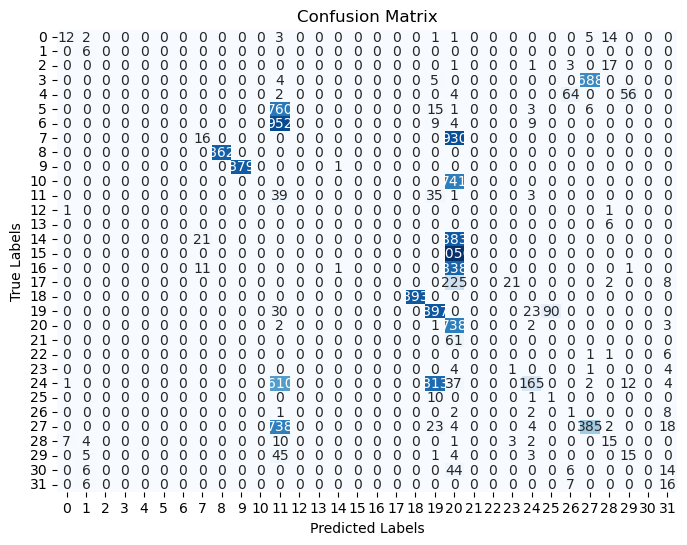

In [106]:
# Compute the confusion matrix
model_name = 'adab1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

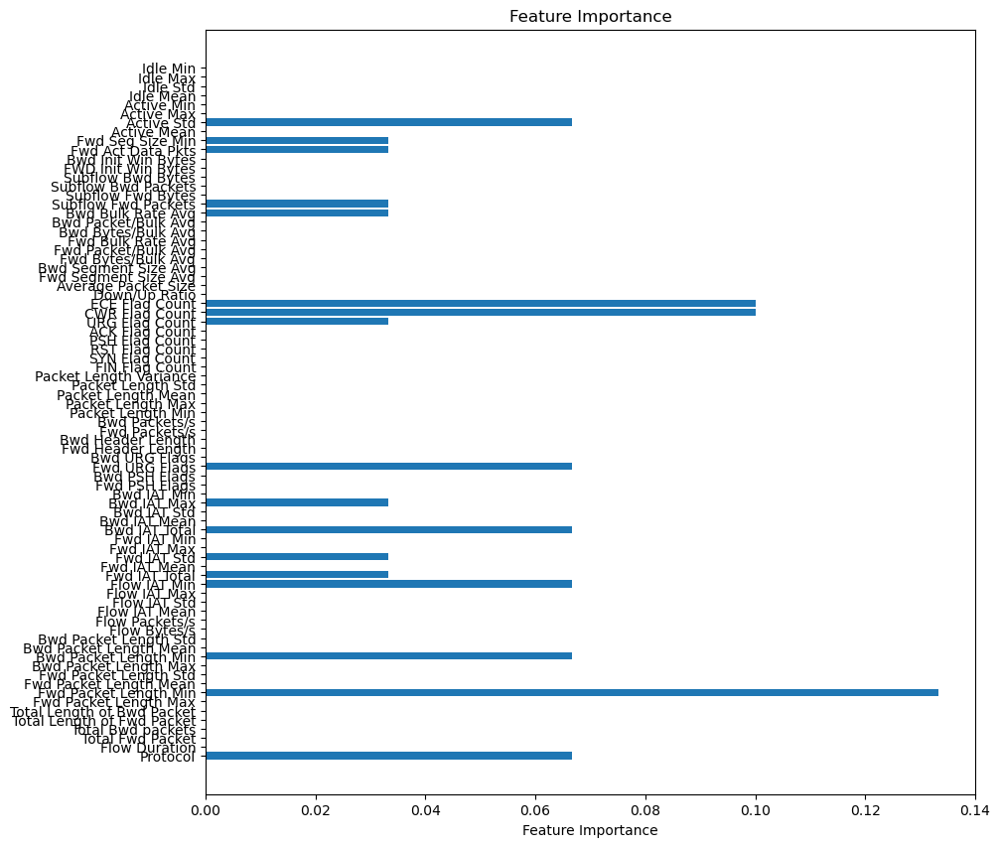

In [107]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'adab1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### adab2

In [108]:
# Evaluate adab2
model_name = 'adab2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: adab2
Accuracy: 0.46118569719526786
F1 Score: 0.2973851158895294
Precision: 0.44774892264893823
Recall: 0.35076912206021876
ROC AUC: 0.957279088390026
Confusion Matrix:
 [[ 4  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  5  0 ... 10  0  0]
 [ 0  6  0 ...  0  0 19]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.11      0.18        38
           1       0.19      1.00      0.32         6
           2       0.00      0.00      0.00        22
           3       0.00      0.00      0.00       697
           4       0.00      0.00      0.00       126
           5       1.00      0.45      0.63       785
           6       0.00      0.00      0.00       974
           7       0.20      0.23      0.21       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.00      0.00      0.00     

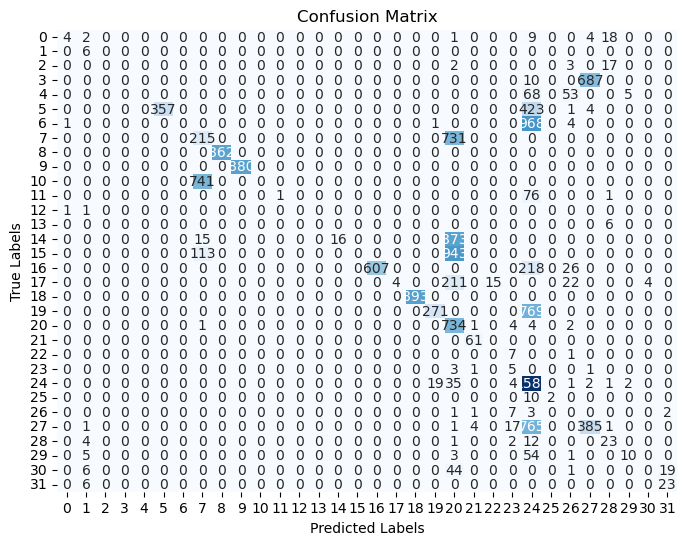

In [109]:
# Compute the confusion matrix
model_name = 'adab2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

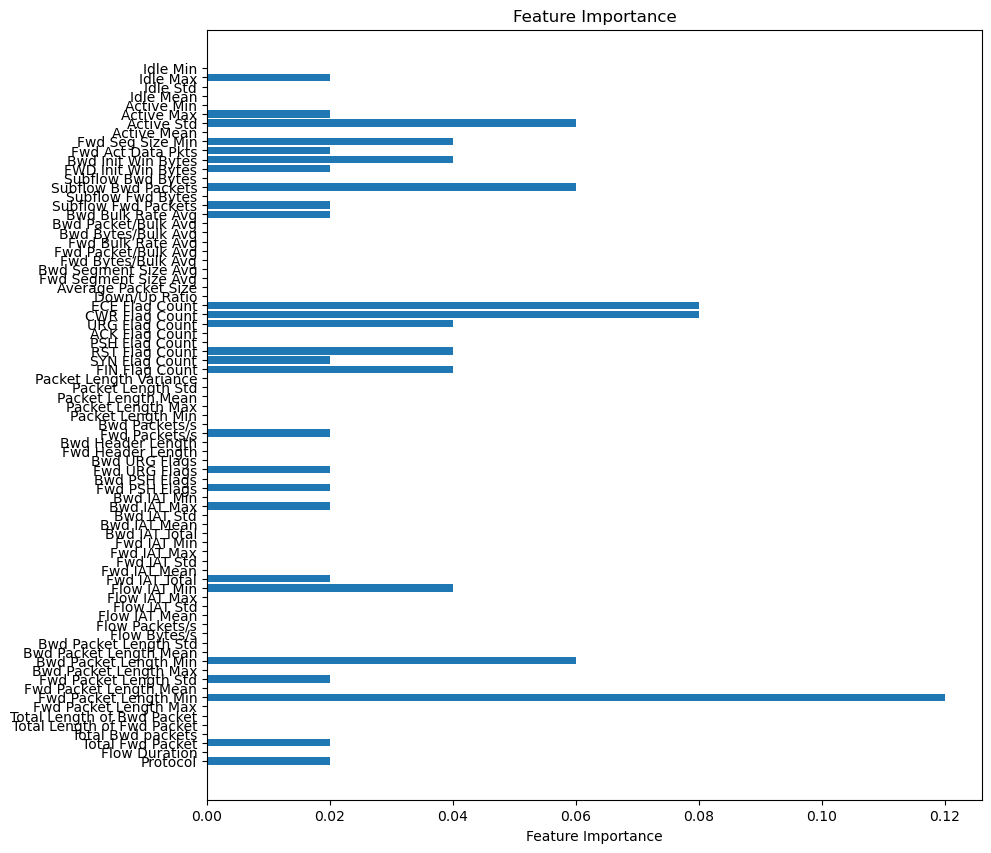

In [110]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'adab2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### adab3

In [111]:
# Evaluate adab3
model_name = 'adab3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: adab3
Accuracy: 0.6215605476538615
F1 Score: 0.4046442101372879
Precision: 0.4760487264595946
Recall: 0.47514862402150415
ROC AUC: 0.9721360251797422
Confusion Matrix:
 [[11  2  0 ...  1  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [ 0  5  0 ...  5  0  0]
 [ 0  6  0 ...  0 44  0]
 [ 0  6  0 ...  0  0  0]]
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.29      0.40        38
           1       0.21      1.00      0.35         6
           2       0.00      0.00      0.00        22
           3       0.00      0.00      0.00       697
           4       0.00      0.00      0.00       126
           5       0.95      0.45      0.61       785
           6       0.00      0.00      0.00       974
           7       0.35      1.00      0.52       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.00      0.00      0.00      

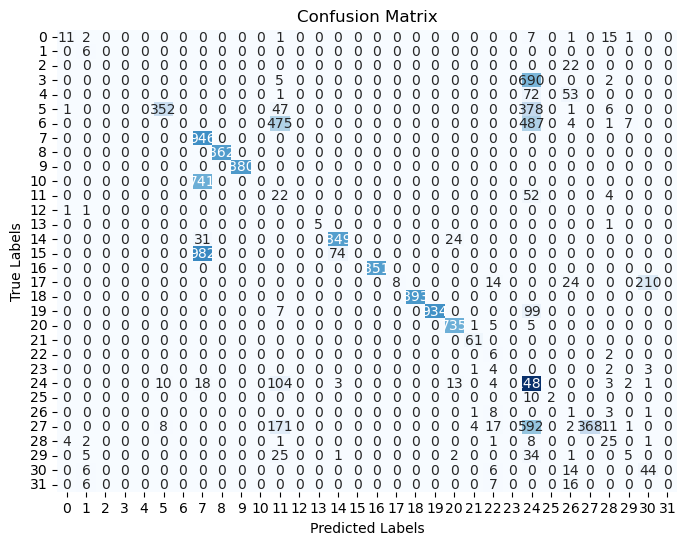

In [112]:
# Compute the confusion matrix
model_name = 'adab3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

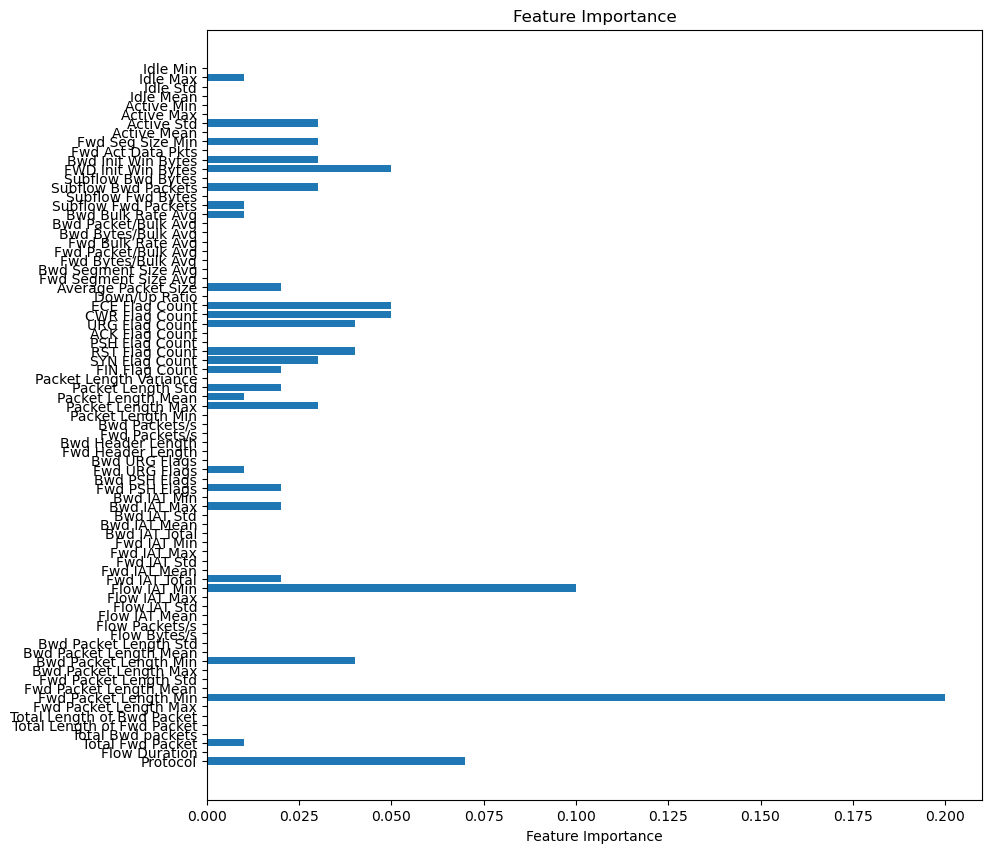

In [113]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'adab3'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

## **Catboost (Categorical Boosting)** ปัก

In [114]:
hyperparameters = [
    {'iterations': 30, 'depth': 2, 'learning_rate': 0.3, 'bootstrap_type': 'Bernoulli', 'subsample': 0.8},  # Lower number of iterations, shallow trees, moderate learning rate
    {'iterations': 40, 'depth': 2, 'learning_rate': 0.25, 'bootstrap_type': 'Bernoulli', 'subsample': 0.8},  # Slightly more iterations, reduced learning rate
    {'iterations': 50, 'depth': 2, 'learning_rate': 0.2, 'bootstrap_type': 'Bernoulli', 'subsample': 0.8}   # Increased iterations, further reduced learning rate
]

# Loop to create and train 3 CatBoost models
for i in range(3):
    # Create and train the model
    model = CatBoostClassifier(random_state=42, verbose=0, **hyperparameters[i])
    model.fit(X_train, y_train)

    # Store the model in the dictionary with a unique name
    models[f'catb{i+1}'] = model

# Print confirmation
print("CatBoost models trained and stored in the 'models' dictionary.")

CatBoost models trained and stored in the 'models' dictionary.


In [115]:
for i in range(1, 4):
    model_name = f'catb{i}'  
    
    # Predict using the model
    y_pred = models[model_name].predict(X_test)
    
    # Calculate evaluation metrics
    accuracy_[model_name] = accuracy_score(y_test, y_pred)
    f1_[model_name] = f1_score(y_test, y_pred, average='macro')
    precision_[model_name] = precision_score(y_test, y_pred, average='macro')
    recall_[model_name] = recall_score(y_test, y_pred, average='macro')
    
    # Handle multi-class ROC AUC calculation
    if len(np.unique(y_test)) > 2:
        roc_auc_[model_name] = roc_auc_score(
            y_test, models[model_name].predict_proba(X_test), multi_class='ovr', average='macro'
        )
    else:
        roc_auc_[model_name] = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    
    # Store confusion matrix and classification report
    confusion_matrix_[model_name] = confusion_matrix(y_test, y_pred)
    classification_reports_[model_name] = classification_report(y_test, y_pred)

## **Result of Catboost**

### catb1

In [116]:
# Evaluate catb1
model_name = 'catb1'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: catb1
Accuracy: 0.9131330586202313
F1 Score: 0.7886539696071075
Precision: 0.7771333247546302
Recall: 0.8407967810941359
ROC AUC: 0.9931955964253302
Confusion Matrix:
 [[22  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  5  1 ... 51  0  0]
 [ 0  6  0 ...  0 64  0]
 [ 0  5  0 ...  0  0 24]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.58      0.71        38
           1       0.22      1.00      0.36         6
           2       0.73      1.00      0.85        22
           3       1.00      0.95      0.97       697
           4       0.97      0.91      0.94       126
           5       0.90      0.97      0.93       785
           6       0.92      0.92      0.92       974
           7       0.95      0.95      0.95       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.95      1.00      0.97       

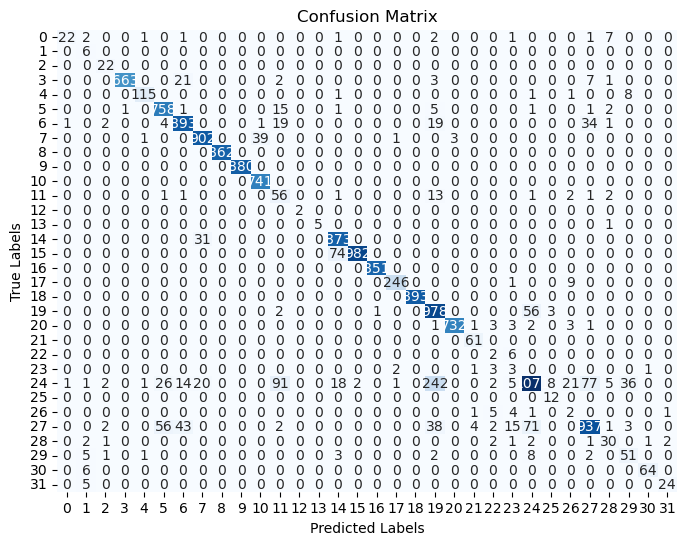

In [117]:
# Compute the confusion matrix
model_name = 'catb1'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

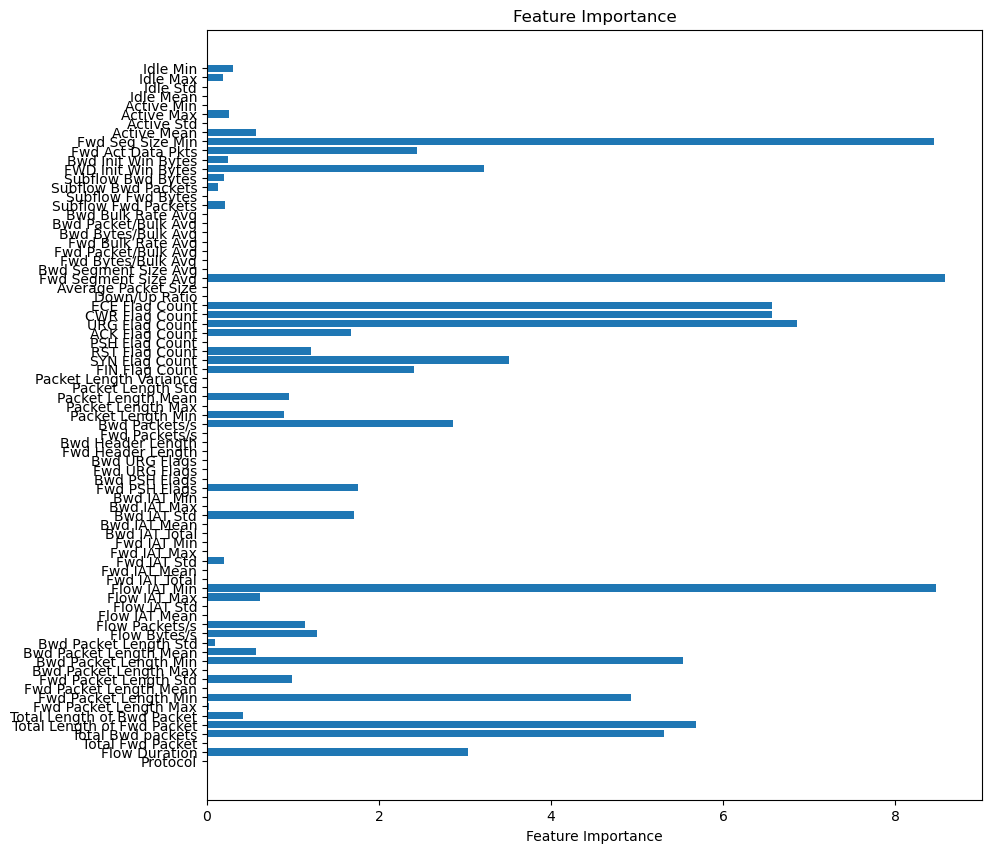

In [118]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'catb1'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### catb2

In [119]:
# Evaluate catb2
model_name = 'catb2'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: catb2
Accuracy: 0.9207098232088262
F1 Score: 0.7780630584095467
Precision: 0.7681035728346512
Recall: 0.8446543488760043
ROC AUC: 0.9939628750481544
Confusion Matrix:
 [[24  2  0 ...  0  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  5  2 ... 50  0  0]
 [ 0  6  0 ...  0 57  0]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.63      0.75        38
           1       0.21      1.00      0.34         6
           2       0.81      1.00      0.90        22
           3       1.00      0.96      0.98       697
           4       0.97      0.92      0.94       126
           5       0.88      0.98      0.93       785
           6       0.93      0.94      0.93       974
           7       0.95      0.94      0.94       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.92      1.00      0.96       

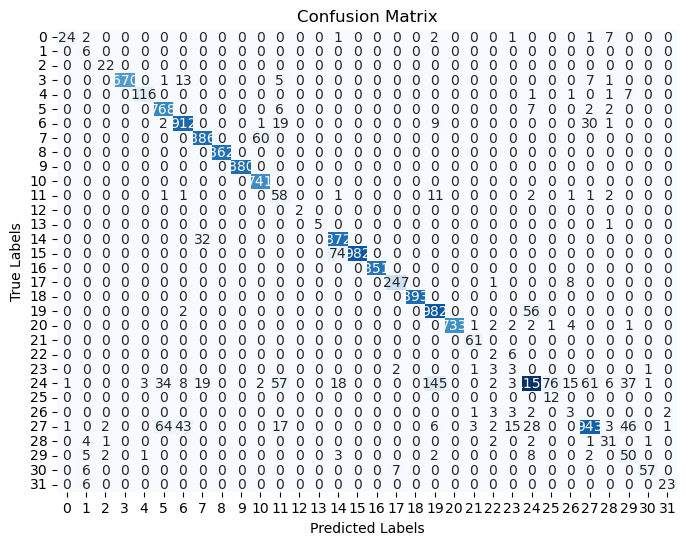

In [120]:
# Compute the confusion matrix
model_name = 'catb2'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

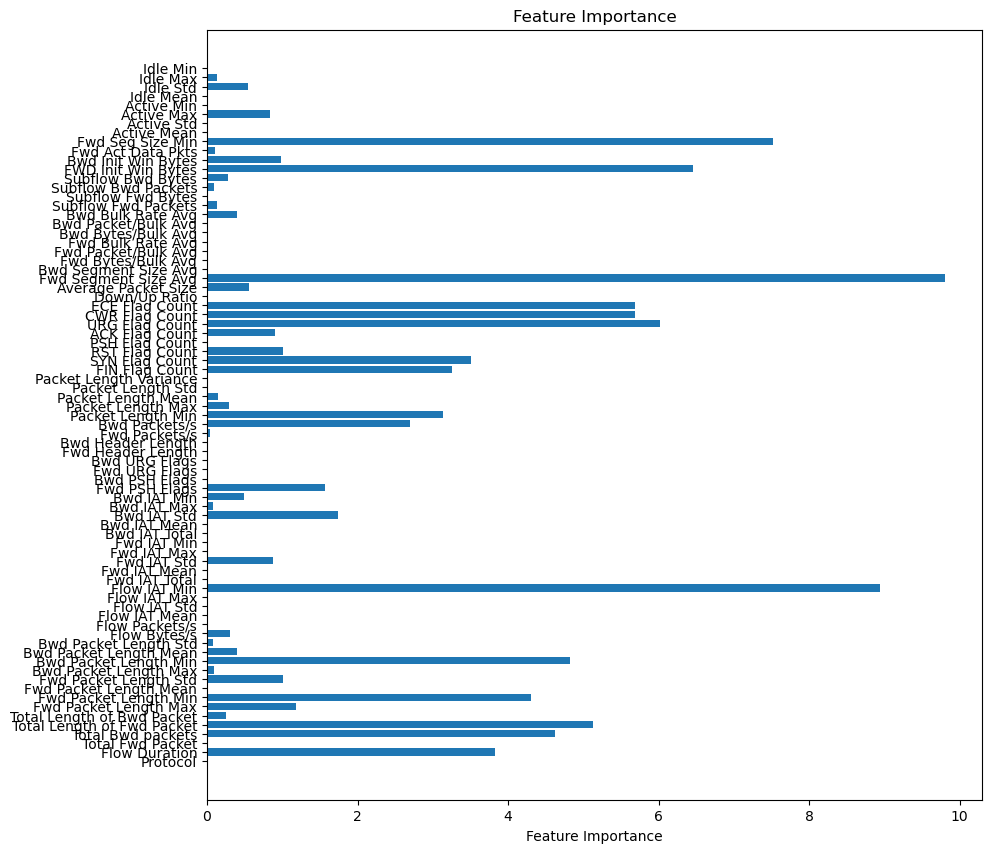

In [121]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'catb2'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

### catb3

In [122]:
# Evaluate catb3
model_name = 'catb3'  # Specify the model name
print("Model:", model_name)
print("Accuracy:", accuracy_[model_name])
print("F1 Score:", f1_[model_name])
print("Precision:", precision_[model_name])
print("Recall:", recall_[model_name])
print("ROC AUC:", roc_auc_[model_name])
print("Confusion Matrix:\n", confusion_matrix_[model_name])
print("Classification Report:\n", classification_reports_[model_name])

Model: catb3
Accuracy: 0.9288847534228366
F1 Score: 0.8071001008862565
Precision: 0.7949894601362087
Recall: 0.8496353165354691
ROC AUC: 0.9954085304620499
Confusion Matrix:
 [[24  2  0 ...  1  0  0]
 [ 0  6  0 ...  0  0  0]
 [ 0  0 22 ...  0  0  0]
 ...
 [ 0  5  2 ... 49  0  0]
 [ 0  6  0 ...  0 64  0]
 [ 0  6  0 ...  0  0 23]]
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.63      0.73        38
           1       0.22      1.00      0.36         6
           2       0.71      1.00      0.83        22
           3       1.00      0.98      0.99       697
           4       0.97      0.92      0.95       126
           5       0.91      0.97      0.94       785
           6       0.97      0.94      0.95       974
           7       0.95      0.94      0.94       946
           8       1.00      1.00      1.00       862
           9       1.00      1.00      1.00       880
          10       0.93      1.00      0.96       

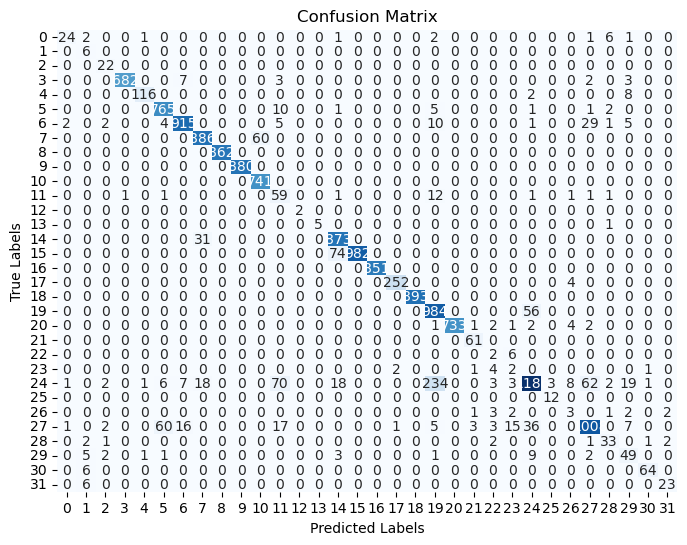

In [123]:
# Compute the confusion matrix
model_name = 'catb3'  # Specify the model name
cm = confusion_matrix_[model_name]

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=models[model_name].classes_, yticklabels=models[model_name].classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

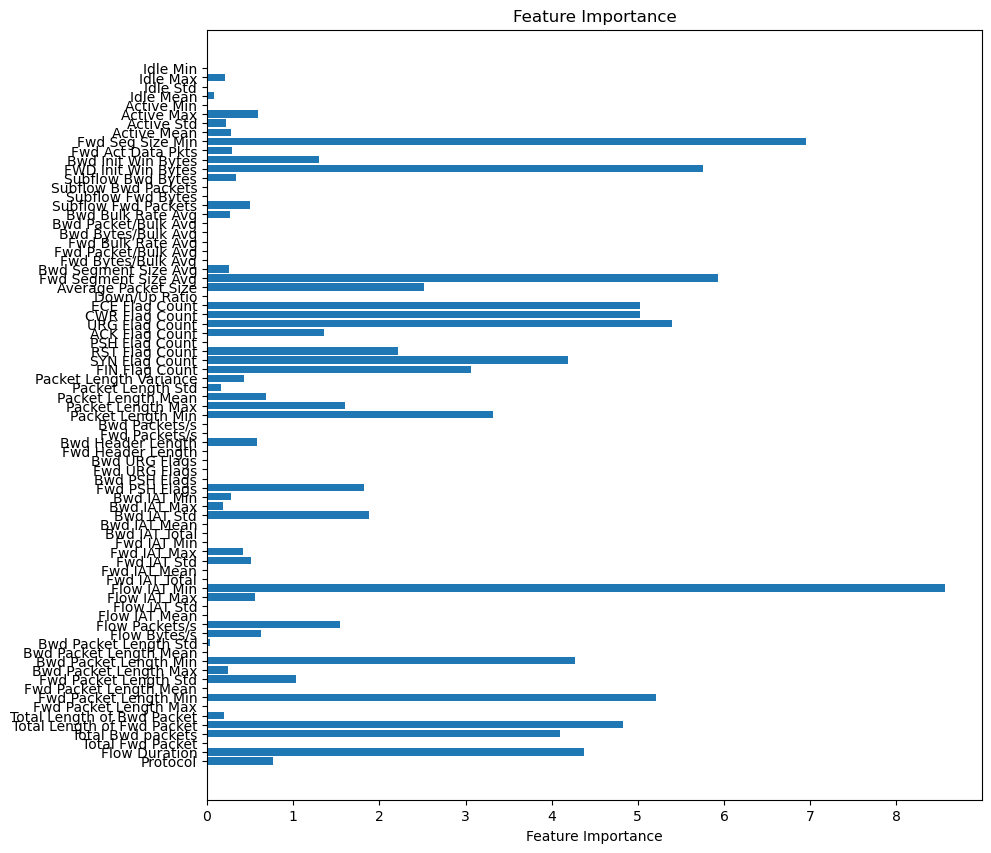

In [124]:
# visualizes the importance of different features in your Random Forest model
# The longer the bar for a feature, the more important that feature is in the model's decision-making process.
# Helps you understand which features are most influential in predicting network anomalies.

model_name = 'catb3'  # Specify the model name

plt.figure(figsize=(10, 10))

importance_rfc = models[model_name].feature_importances_
features = df.columns[:-1]

plt.barh(features, importance_rfc)
plt.xlabel('Feature Importance')
plt.title('Feature Importance')
plt.show()

# **Comparing model efficiently**

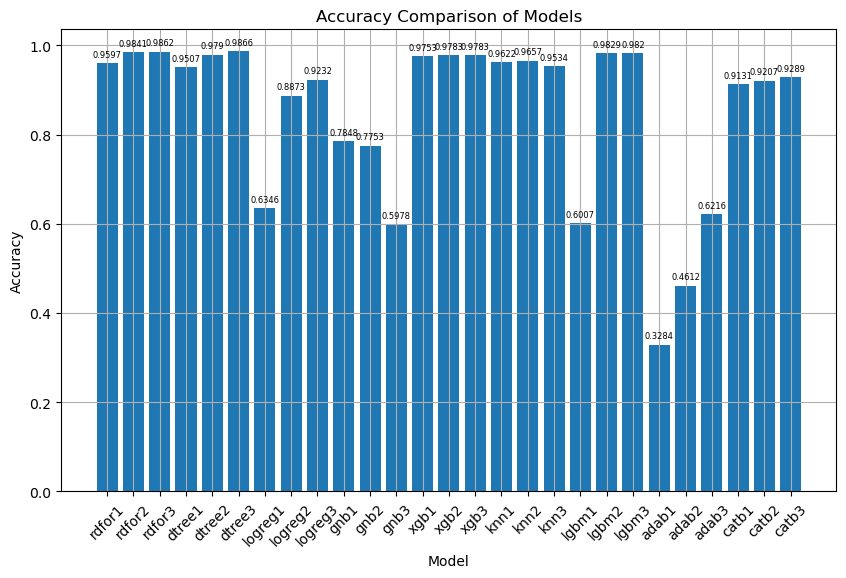

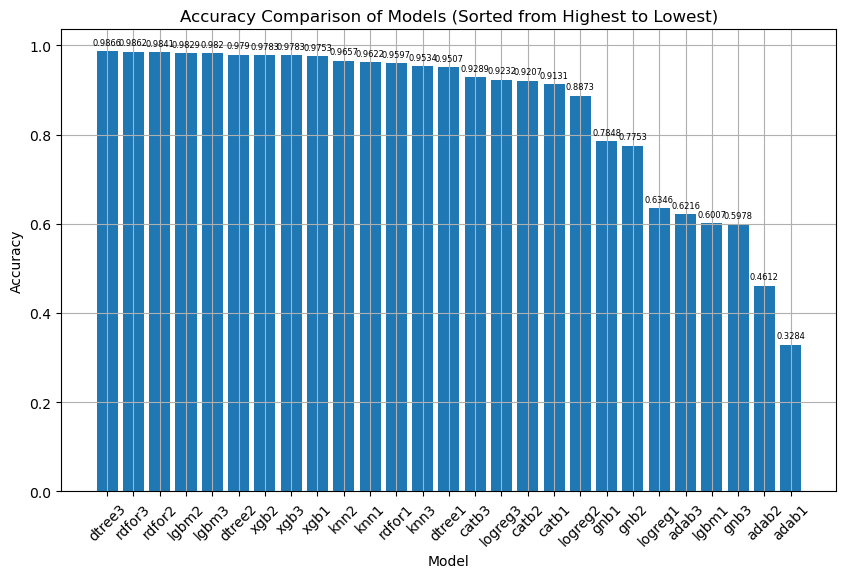

In [128]:
# Combine model names
model_name = [  'rdfor1', 'rdfor2', 'rdfor3', 
                'dtree1', 'dtree2', 'dtree3', 
                'logreg1', 'logreg2', 'logreg3', 
                'gnb1', 'gnb2', 'gnb3', 
                'xgb1', 'xgb2', 'xgb3',
                'knn1', 'knn2', 'knn3',
                'lgbm1', 'lgbm2', 'lgbm3',
                'adab1', 'adab2', 'adab3',
                'catb1', 'catb2', 'catb3'
             ]

# Extract accuracy values
accuracy_values = [accuracy_[model] for model in model_name]

# Create a chart
plt.figure(figsize=(10, 6))
bars = plt.bar(model_name, accuracy_values)  # Store the bar objects
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.title("Accuracy Comparison of Models")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate model names for better readability

# Add numbers on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 4), ha='center', va='bottom', fontsize=6)

plt.show()

# Sort model names and accuracy values in descending order of accuracy
sorted_data = sorted(zip(model_name, accuracy_values), key=lambda x: x[1], reverse=True)
sorted_model_names, sorted_accuracy_values = zip(*sorted_data)

# Create a chart
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_model_names, sorted_accuracy_values)  # Use sorted data
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.title("Accuracy Comparison of Models (Sorted from Highest to Lowest)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate model names for better readability

# Add numbers on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 4), ha='center', va='bottom', fontsize=6)

plt.show()

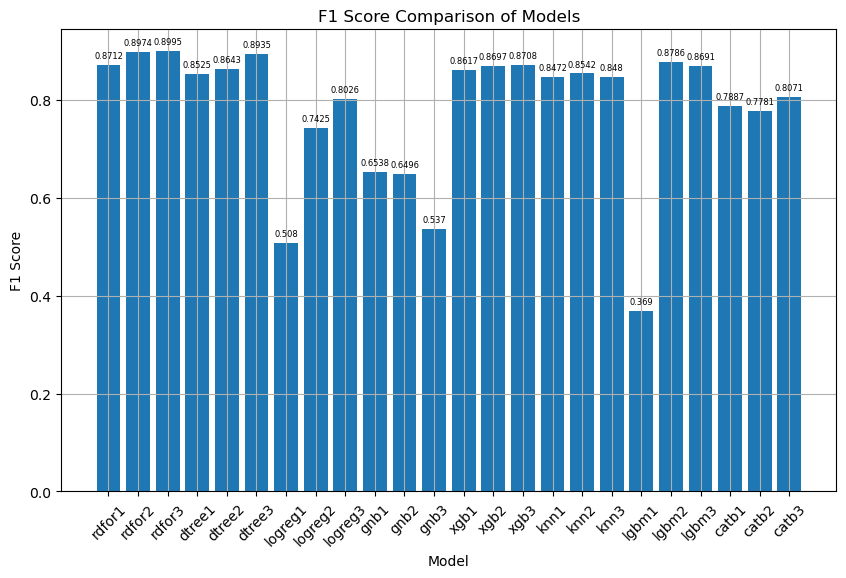

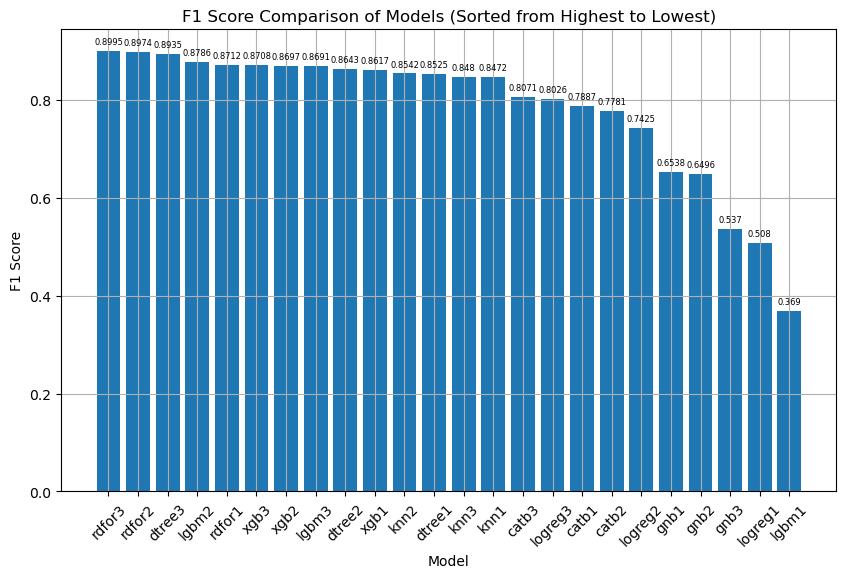

In [129]:
# Combine model names
model_name = [  'rdfor1', 'rdfor2', 'rdfor3', 
                'dtree1', 'dtree2', 'dtree3', 
                'logreg1', 'logreg2', 'logreg3', 
                'gnb1', 'gnb2', 'gnb3', 
                'xgb1', 'xgb2', 'xgb3',
                'knn1', 'knn2', 'knn3',
                'lgbm1', 'lgbm2', 'lgbm3',
                'catb1', 'catb2', 'catb3'
             ]

# Extract accuracy values
f1_values = [f1_[model] for model in model_name]

# Create a chart
plt.figure(figsize=(10, 6))
bars = plt.bar(model_name, f1_values)  # Store the bar objects
plt.xlabel("Model")
plt.ylabel("F1 Score")
plt.title("F1 Score Comparison of Models")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate model names for better readability

# Add numbers on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 4), ha='center', va='bottom', fontsize=6)

plt.show()

# Sort model names and accuracy values in descending order of accuracy
sorted_data = sorted(zip(model_name, f1_values), key=lambda x: x[1], reverse=True)
sorted_model_names, sorted_f1_values = zip(*sorted_data)

# Create a chart
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_model_names, sorted_f1_values)  # Use sorted data
plt.xlabel("Model")
plt.ylabel("F1 Score")
plt.title("F1 Score Comparison of Models (Sorted from Highest to Lowest)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate model names for better readability

# Add numbers on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 4), ha='center', va='bottom', fontsize=6)

plt.show()

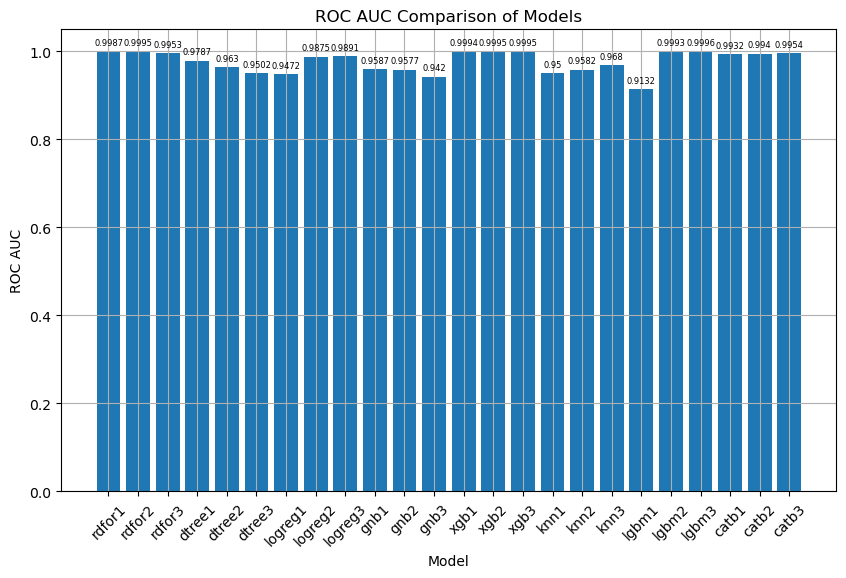

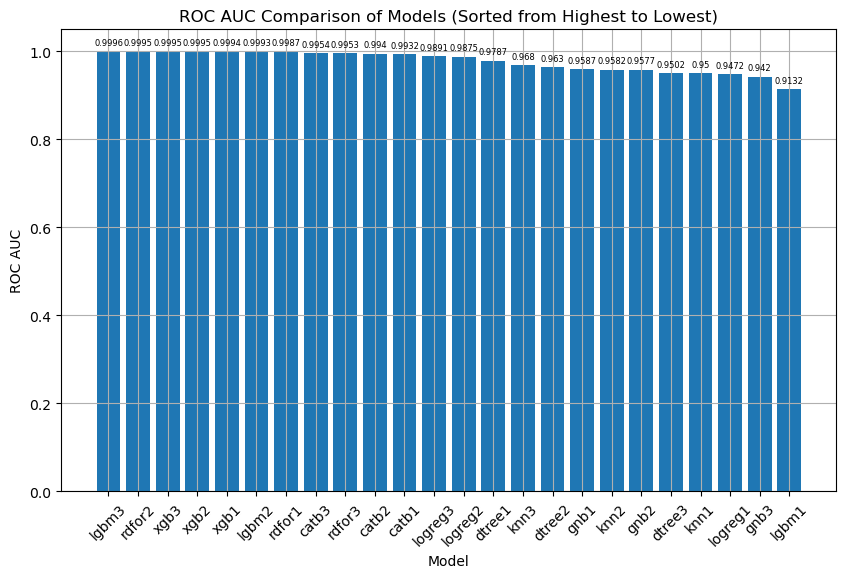

In [130]:
# Combine model names
model_name = [  'rdfor1', 'rdfor2', 'rdfor3', 
                'dtree1', 'dtree2', 'dtree3', 
                'logreg1', 'logreg2', 'logreg3', 
                'gnb1', 'gnb2', 'gnb3', 
                'xgb1', 'xgb2', 'xgb3',
                'knn1', 'knn2', 'knn3',
                'lgbm1', 'lgbm2', 'lgbm3',
                'catb1', 'catb2', 'catb3'
             ]

# Extract accuracy values
roc_auc_values = [roc_auc_[model] for model in model_name]

# Create a chart
plt.figure(figsize=(10, 6))
bars = plt.bar(model_name, roc_auc_values)  # Store the bar objects
plt.xlabel("Model")
plt.ylabel("ROC AUC")
plt.title("ROC AUC Comparison of Models")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate model names for better readability

# Add numbers on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 4), ha='center', va='bottom', fontsize=6)

plt.show()

# Sort model names and accuracy values in descending order of accuracy
sorted_data = sorted(zip(model_name, roc_auc_values), key=lambda x: x[1], reverse=True)
sorted_model_names, sorted_roc_auc_values = zip(*sorted_data)

# Create a chart
plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_model_names, sorted_roc_auc_values)  # Use sorted data
plt.xlabel("Model")
plt.ylabel("ROC AUC")
plt.title("ROC AUC Comparison of Models (Sorted from Highest to Lowest)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate model names for better readability

# Add numbers on top of bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 4), ha='center', va='bottom', fontsize=6)

plt.show()

**time spent on each model training process**  
rdfor = 1m45s  
dtree = 39s  
logreg = 2m32s (downgrade for effeciently) (2h++ on full capacity around 90++)  
gnb = 0.9s  
xgb = 1m56s  
knn = 3m22s  
lgbm = 52s  
adab = 4m35s (downgrade for effeciently) (20m++ on full capacity around 90++)  
catb = 1m15s  